In [1]:
# import library
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Rectangle

In [ ]:
# read data
data = pd.read_csv(
    "karnataka.csv"
)

In [3]:
# change to DataFrame
df = pd.DataFrame(data=data)
df

,Year,Location,Area,Rainfall,Temperature,Soil type,Irrigation,yeilds,Humidity,Crops,price,Season
0,2004,Mangalore,1279,2903.1,27,Alluvial,Drip,2570,57.0,Coconut,200000.0,Kharif
1,2004,Mangalore,13283,2903.1,27,Alluvial,Drip,27170,57.5,Coconut,4847.0,Kharif
2,2004,Mangalore,52119,2903.1,27,Alluvial,Drip,114744,57.0,Coconut,51239.0,Kharif
3,2004,Mangalore,725,2996.6,27,Alluvial,Drip,1402,55.0,Coconut,216396.0,Kharif
4,2004,Mangalore,12885,2996.6,27,Alluvial,Drip,23456,56.0,Coconut,2644.0,Kharif
...,...,...,...,...,...,...,...,...,...,...,...,...
3153,2013,Davangere,46990,3296,27,NaN,Drip,107809,53.5,Coconut,51239.0,Rabi
3154,2014,Davangere,103,3296,27,NaN,Drip,1132,52.5,Coconut,216396.0,Rabi
3155,2015,Davangere,8239,3550,27,NaN,Drip,23960,56.0,Coconut,2644.0,Rabi
3156,2016,Davangere,44563,3550,27,NaN,Drip,126487,57.0,Coconut,44235.0,Rabi


In [4]:
# information of data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3158 entries, 0 to 3157
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Year         3158 non-null   int64  
 1   Location     3158 non-null   object 
 2   Area         3155 non-null   object 
 3   Rainfall     3157 non-null   object 
 4   Temperature  3157 non-null   object 
 5   Soil type    3100 non-null   object 
 6   Irrigation   3156 non-null   object 
 7   yeilds       3158 non-null   object 
 8   Humidity     3156 non-null   float64
 9   Crops        3156 non-null   object 
 10  price        3157 non-null   float64
 11  Season       3157 non-null   object 
dtypes: float64(2), int64(1), object(9)
memory usage: 296.2+ KB


In [5]:
# row and columns data
print(f"row: {df.shape[0]}\ncolumns: {df.shape[1]}")

row: 3158
columns: 12


In [6]:
# checking missing values
df_missing_values = pd.DataFrame(
    {
        "columns": df.columns,
        "missing values": df.isna().sum(),
        "percent missing values": (df.isna().sum() / len(df) * 100)
    }
)
df_missing_values.reset_index(inplace=True, drop=True)
df_missing_values

,columns,missing values,percent missing values
0,Year,0,0.000000
1,Location,0,0.000000
2,Area,3,0.094997
3,Rainfall,1,0.031666
4,Temperature,1,0.031666
5,Soil type,58,1.836605
6,Irrigation,2,0.063331
7,yeilds,0,0.000000
8,Humidity,2,0.063331
9,Crops,2,0.063331


<font face="Times New Roman" size=15>
number of missing values in each columns:
<br>
Area: 3<br>
Rainfall: 1<br>
Temperature: 1<br>
Soil type: 58<br>
irrigation: 2<br>
Humidity: 2<br>
Crops: 2<br>
price: 1<br>
Season: 1

In [7]:
for col in df.columns:
    print(f"unique values '{col}':\n{df[col].unique()}")
    print("_" * 100)

unique values 'Year':
[2004 2013 2014 2015 2016 2017 2018 2005 2006 2007 2008 2009 2010 2011
 2012 2019]
____________________________________________________________________________________________________
unique values 'Location':
['Mangalore' 'Kodagu' 'Kasaragodu' 'Raichur' 'Gulbarga' 'Madikeri'
 'Hassan' 'Mysuru' 'Chikmangaluru' 'Bangalore' 'Davangere']
____________________________________________________________________________________________________
unique values 'Area':
['1279' '13283' '52119' '725' '12885' '51179' '468' '11841' '50975' '206'
 '10922' '51390' '177' '10723' '51709' '146' '10910' '51355' '160' '10912'
 '51353' '142' '10505' '51040' '154' '10318' '48083' '143' '9283' '47200'
 '158' '8982' '46990' '103' '8239' '44563' '96' '6949' '44663' '110'
 '6824' '43013' '95' '6441' '4012' '4877' '4930' '4954' '5019' '5127'
 '5174' '5294' '5474' '5864' '7028' '7403' '7501' '7714' '7856' '32' '1'
 '30' '6' '15' '4' '39' '12' '3' '17' '9' '21' '11' '8' '29' '13736'
 '14003' '1417

# Initial data analysis

## There are many suspicious values in the columns, let's go check them out.

In [8]:
df.nunique()

Year            16
Location        11
Area           157
Rainfall        23
Temperature    107
Soil type       27
Irrigation       3
yeilds         163
Humidity        19
Crops           13
price           25
Season           3
dtype: int64

In [9]:
Abbreviations = ["?", "_"]

In [10]:
df.replace(Abbreviations, np.nan, inplace=True)

In [11]:
df.dropna(inplace=True)

### We saw how many and what percentage of missing values ​​each column has and how many and what percentage of rows are deleted due to missing values.

### The number of missing values ​​is low and 70 rows out of 3158 are deleted due to missing values. I don't know the data source, I will delete it.

### In data I saw that it had '?' and '_' values, which I replaced with the missing value and then deleted.

### The Area,Year, Rainfall, Temperator, yeilds columns should be changed to  type

In [12]:
df["Year"] = df["Year"].astype(dtype=np.int32)
df["Area"] = df["Area"].astype(dtype=np.float64)
df["Temperature"] = df["Temperature"].astype(dtype=np.float64)
df["yeilds"] = df["yeilds"].astype(dtype=np.float64)
df["Rainfall"] = df["Rainfall"].astype(dtype=np.float64)

### Now I need to see how the columns relate to each other

In [13]:
crr = df.corr(numeric_only=True)

<Figure size 4000x2000 with 0 Axes>

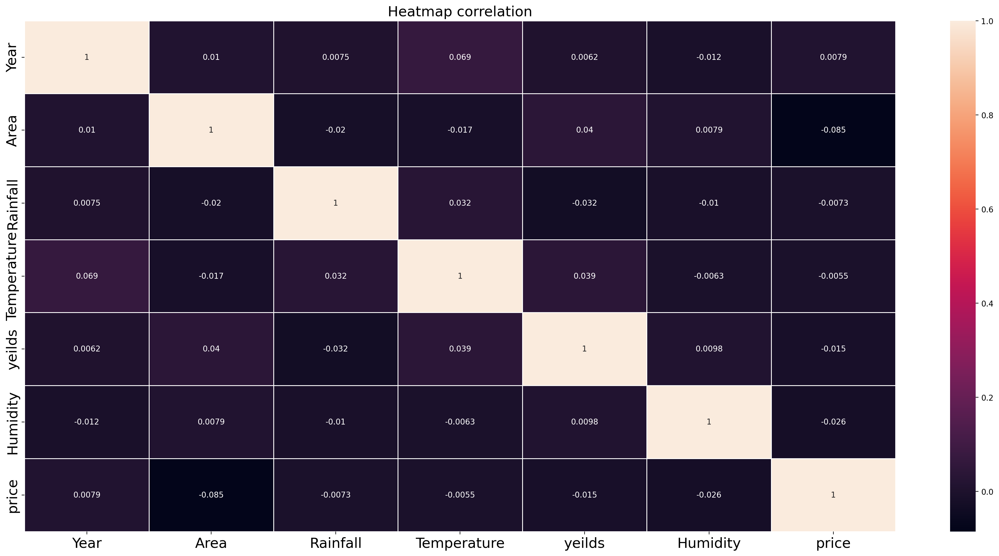

In [14]:
plt.figure(figsize=(20, 10), dpi=200)
fig, ax = plt.subplots(figsize=(20, 10), dpi=200)
sns.heatmap(crr, annot=True, linewidths=.5, ax=ax)
plt.tick_params(axis="both",labelsize=18)
plt.title("Heatmap correlation", fontsize=18)
plt.tight_layout()
plt.show()

## I need to see how many of each value are in the columns that have categorical mode by drawing a chart.

### location count 

In [15]:
loc_count = df["Location"].value_counts()
loc_count

Location
Hassan           794
Gulbarga         500
Mangalore        341
Chikmangaluru    338
Madikeri         240
Kasaragodu       229
Raichur          229
Mysuru           222
Kodagu           191
Name: count, dtype: int64

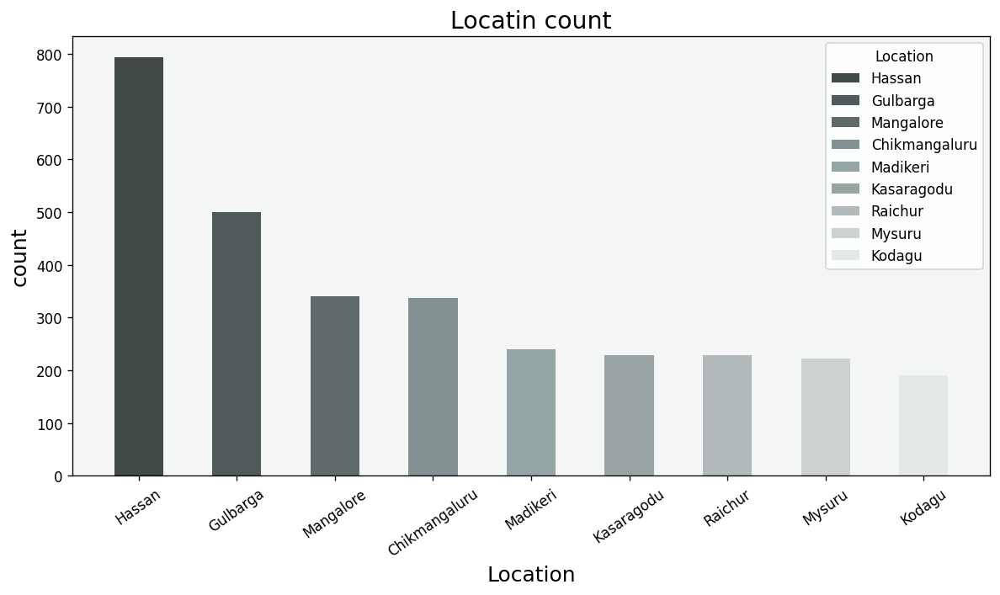

In [16]:
fig, ax = plt.subplots(figsize=(10, 6), dpi=120)
color_bar = [
    "#424949",
    "#515a5a",
    "#616a6b",
    "#839192",
    "#95a5a6",
    "#99a3a4",
    "#b2babb",
    "#ccd1d1",
    "#e5e8e8",
]
ax.bar(
    x=loc_count.index,
    height=loc_count,
    label=loc_count.index,
    color=color_bar,
    width=0.5,
)
plt.title("Locatin count", fontsize=17)
plt.xlabel("Location", fontsize=15)
plt.ylabel("count", fontsize=15)
ax.set_facecolor("#f4f6f6")
ax.legend(title="Location", title_fontsize=10, fontsize=10)
plt.xticks(rotation=35)
plt.tight_layout()
plt.show()

### We found that 'hassan' is the most common location in the data.

### Soil type count

In [17]:
count_soil_type = df["Soil type"].value_counts()
count_soil_type

Soil type
Alluvial                458
Laterite                280
Loam                    280
Sandy loam              263
Black                   258
Sandy loam              216
Clay loam               196
Sandy                   186
Red                     168
Clay                    105
Dry sandy               100
Drained loam             85
Red                      64
Arid and Desert          62
Gravelly sand            40
Heavy clay               40
Well drained             39
River basins             30
loamy sand               29
Heavy cotton             29
Light sandy              29
Red laterite             25
Black cotton             25
Sandy clay loam          25
Medium textured          21
Medium textured clay     20
Teelah                   11
Name: count, dtype: int64

C:\Users\hosse\AppData\Local\Temp\ipykernel_13356\2075544382.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=count_soil_type, y=count_soil_type.index, palette="mako")


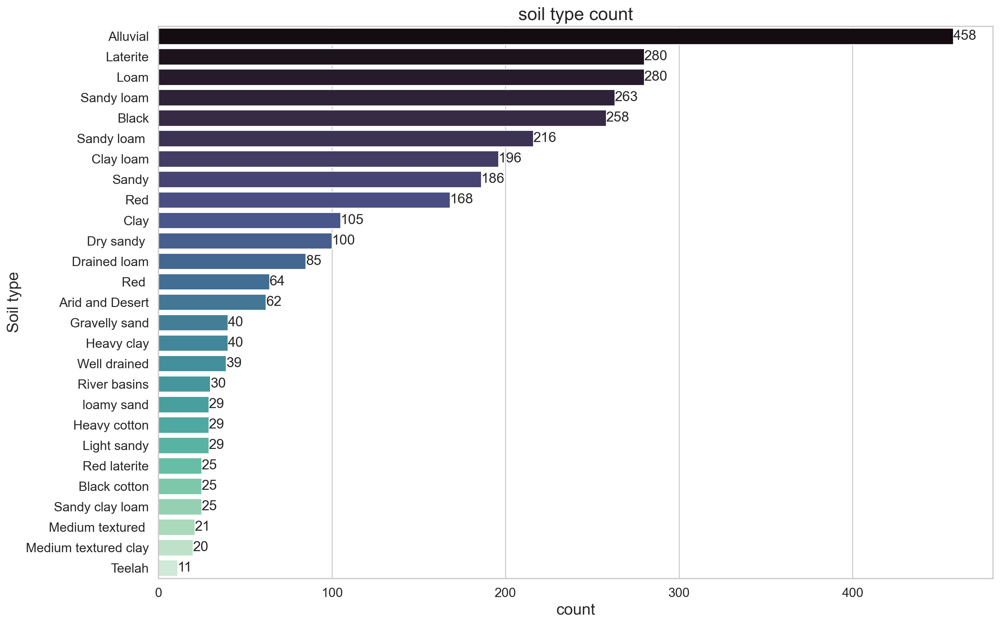

In [18]:
sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(15, 10), dpi=200)
ax = sns.barplot(x=count_soil_type, y=count_soil_type.index, palette="mako")
for bars in ax.containers:
    ax.bar_label(bars, fontsize=14)
plt.title("soil type count", fontsize=18)
plt.xlabel("count", fontsize=16)
plt.ylabel("Soil type", fontsize=16)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

### The 'Alluvial' soil type has the most in the data

In [19]:
crops_count = df["Crops"].value_counts()
crops_count

Crops
Coconut      1440
Ginger        278
Coffee        150
Arecanut      150
Cardamum      150
Tea           150
Pepper        146
Paddy         146
Blackgram     135
Groundnut     131
Cashew        127
Cocoa          60
Cotton         21
Name: count, dtype: int64

C:\Users\hosse\AppData\Local\Temp\ipykernel_13356\1250022093.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=crops_count, y=crops_count.index, palette="mako")


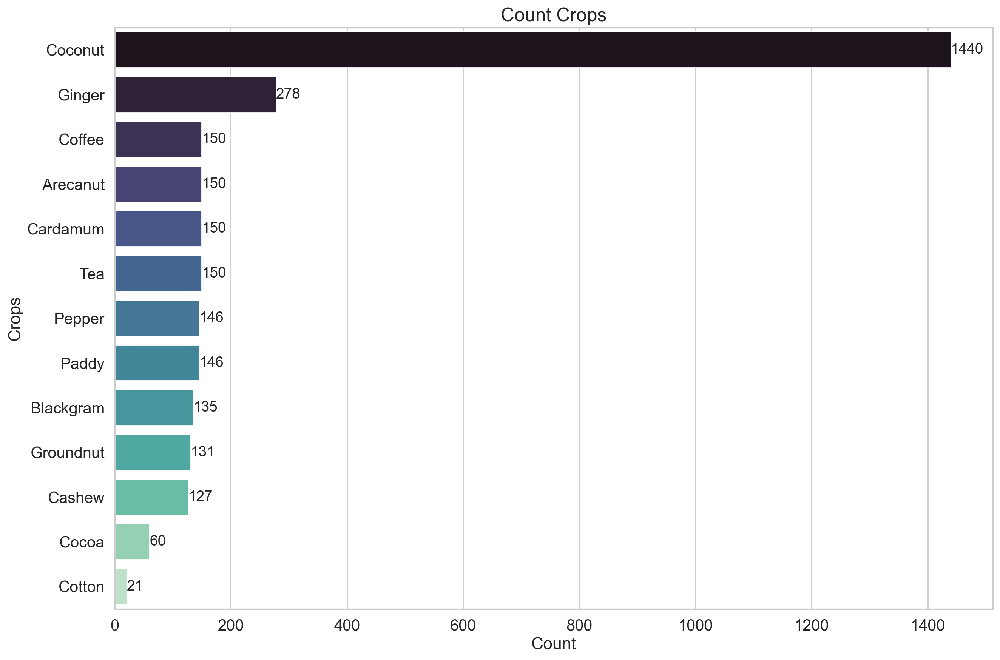

In [20]:
sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(15, 10), dpi=200)
ax = sns.barplot(x=crops_count, y=crops_count.index, palette="mako")
for bars in ax.containers:
    ax.bar_label(bars, fontsize=14)
plt.title("Count Crops", fontsize=18)
plt.xlabel("Count", fontsize=16)
plt.ylabel("Crops", fontsize=16)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

### 'Coconut' is the most common fruit in our data

In [21]:
df.columns

Index(['Year', 'Location', 'Area', 'Rainfall', 'Temperature', 'Soil type',
       'Irrigation', 'yeilds', 'Humidity', 'Crops', 'price', 'Season'],
      dtype='object')

## let check noise and outlires

### First, we will draw with a box plot,We don't use this chart, we just want to make sure.

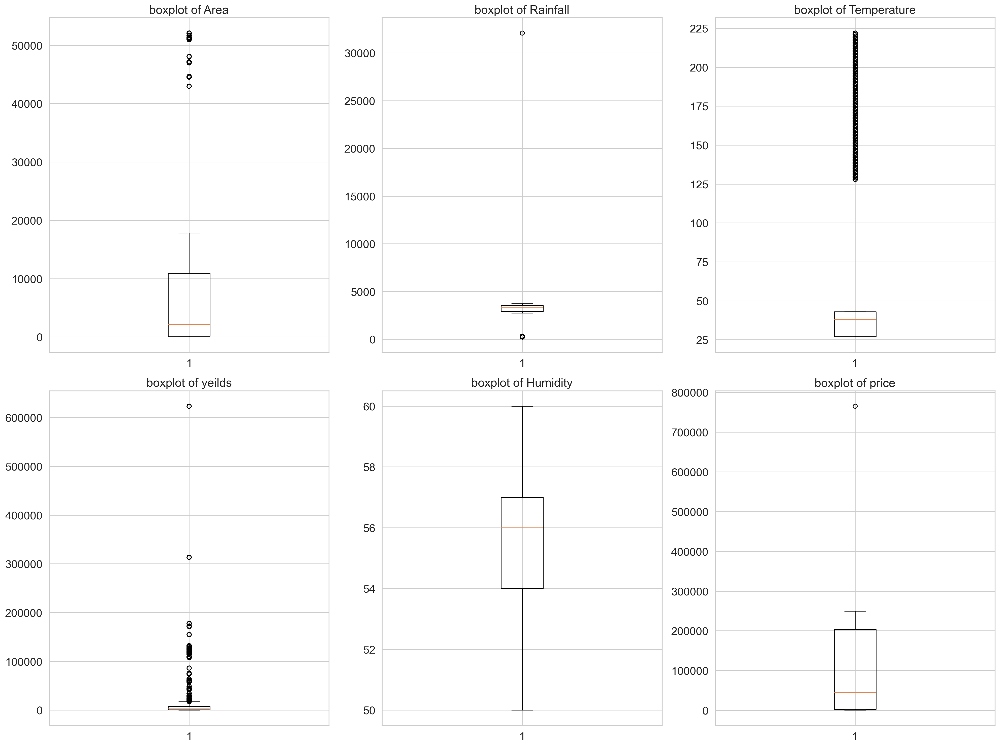

In [22]:
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 15), dpi=200)
columns = ["Area", "Rainfall", "Temperature", "yeilds", "Humidity", "price"]
ax = ax.flatten()
for i, col in enumerate(columns):
    ax[i].boxplot(x=df[col])
    ax[i].set_title(f'boxplot of {col}', fontsize=17)
    ax[i].tick_params(axis='both', labelsize=16)
plt.tight_layout()
plt.show()

## let's try with scatter

### first, 'Area' column with 'price' columns

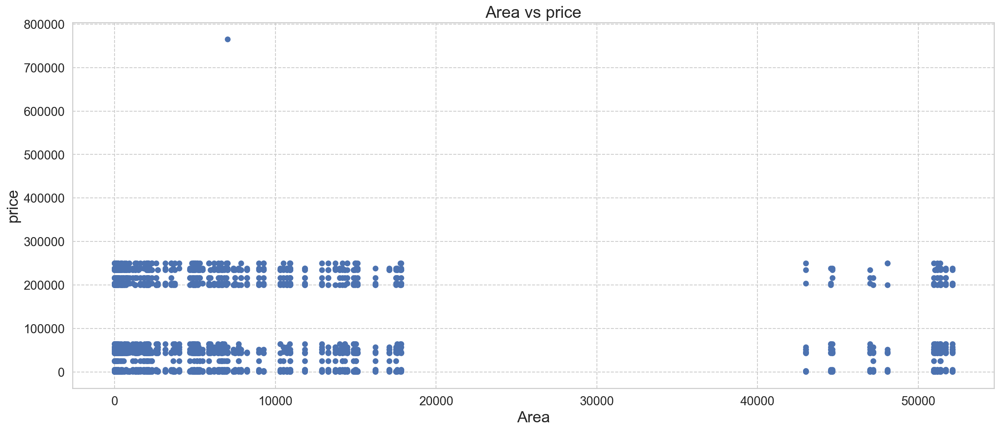

In [23]:
plt.figure(figsize=(20, 8), dpi=150)
plt.scatter(x=df["Area"], y=df["price"])
plt.title("Area vs price", fontsize=20)
plt.xlabel("Area", fontsize=19)
plt.ylabel("price", fontsize=19)
plt.tick_params(labelsize=15, axis="both")
plt.grid(True, linestyle="--")
plt.show()

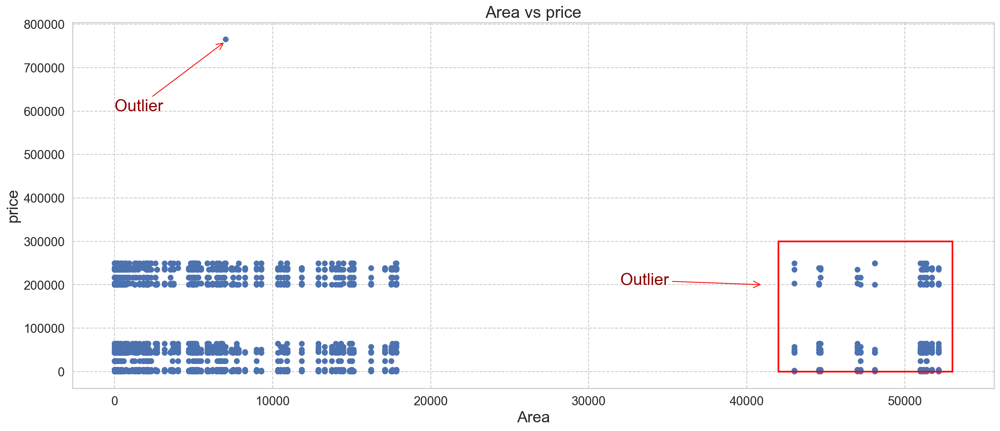

In [24]:
plt.figure(figsize=(20, 8), dpi=150)
plt.scatter(x=df["Area"], y=df["price"])
plt.title("Area vs price", fontsize=20)
plt.xlabel("Area", fontsize=19)
plt.ylabel("price", fontsize=19)
plt.tick_params(labelsize=15, axis="both")
plt.annotate(
    "Outlier",
    xy=(7000, 760000),
    xytext=(0, 600000),
    arrowprops=dict(arrowstyle="->", color="red"),
    fontsize=20,
    color="darkred",
)
ax = plt.gca()
rect = Rectangle(
    (42000, 0),
    width=11000,
    height=300000,
    linewidth=2,
    edgecolor="red",
    facecolor="none",
)
ax.add_patch(rect)
plt.annotate(
    "Outlier",
    xy=(41000, 200000),
    xytext=(32000, 200000),
    arrowprops=dict(arrowstyle="->", color="red"),
    fontsize=20,
    color="darkred",
)
plt.grid(True, linestyle="--")
plt.show()

<font  face="Times New Roman Bold Italic" size=7>Chart analysis:<font>
<br>
In the price and area bar chart, we saw:

The samples is above 700,000(price) and  above 41000(Area).

Since area can be any number higher than this,

therefore it is an outlier.

Area has little to do with price.

The price of agricultural land is affected by several factors that can be divided into two general categories:

1) Physical factors

2) Economic factors

Physical factors include the characteristics of the land itself,
such as soil type, topography, area, and access to water and roads

Economic factors include factors such as inflation rates,
bank interest rates, and market conditions for agricultural products.

A very important point is that do we have a land price of 0?<br>
Some samples have a price of 0,
perhaps the land is free or the data was recorded incorrectly (noise).<br>
Second point:<br>
A series of samples have values higher than 200,000,
which are probably high-value lands or have special conditions or the factors I mentioned above affect its price.

### Second, 'Year' and 'Rainfall'

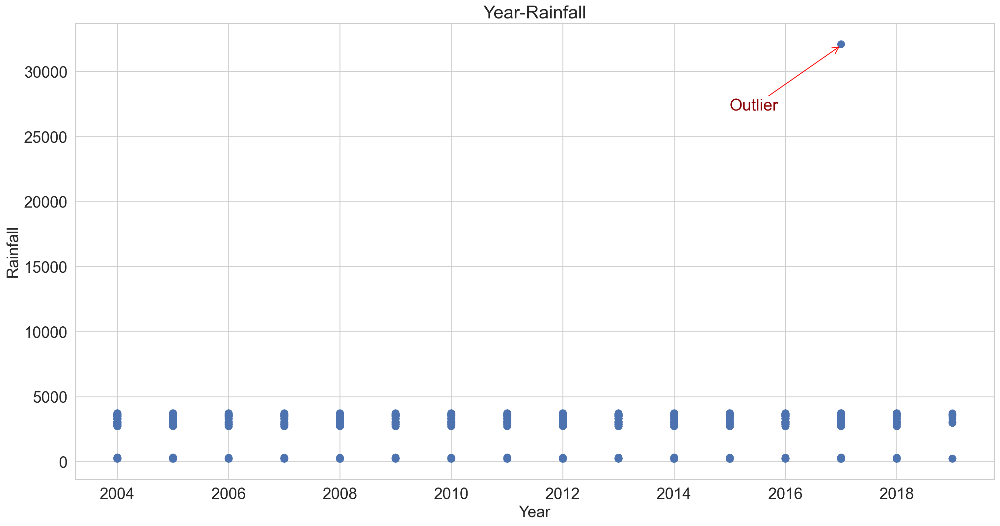

In [25]:
plt.figure(figsize=(20, 10), dpi=180)
plt.scatter(x=df["Year"], y=df["Rainfall"], s=70)
plt.title("Year-Rainfall", fontsize=22)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Rainfall", fontsize=19)
plt.tick_params(axis="both", labelsize=19)
plt.annotate(
    "Outlier",
    xy=(2017, 32000),
    xytext=(2015, 27000),
    arrowprops=dict(arrowstyle="->", color="red"),
    fontsize=20,
    color="darkred",
)
plt.show()

<font  face="Times New Roman Bold Italic" size=7>Chart analysis👆:<font>
<br>
In this Chart:<br>there is a sample that is outside the data range<br>I think it is an outlier because it is possible for the amount of precipitation in a place to be very high in a year<br>


### Area vs yeilds

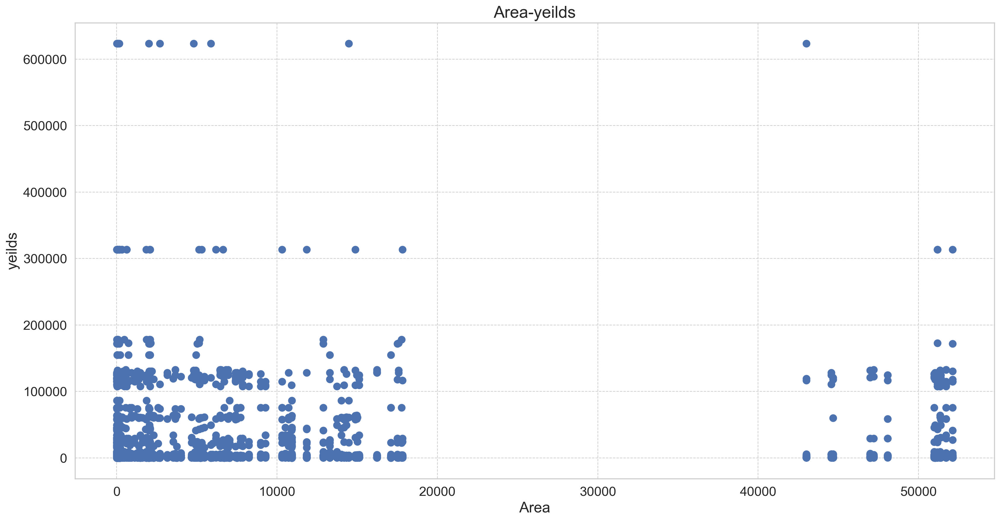

In [26]:
plt.figure(figsize=(20, 10), dpi=200)
plt.scatter(
    x=df["Area"], y=df["yeilds"], s=70
)
plt.title("Area-yeilds", fontsize=20)
plt.xlabel("Area", fontsize=18)
plt.ylabel("yeilds", fontsize=18)
plt.tick_params(labelsize=16, axis="both")
plt.grid(True, linestyle="--", linewidth=0.8)
plt.show()

<font  face="Times New Roman Bold Italic" size=7>Chart analysis:<font>
<br>
Some points to take away from it:

Discrete clusters

The points are concentrated in a few horizontal bands:

Lower band (0–50 thousand units of crop)

Middle band (~100–180 thousand)

Upper band (~300 thousand)

And a few outlying points around ~600 thousand

This suggests that different crops (e.g. wheat, rice, corn, …) probably each have a specific range of total yields and that the total yield stabilizes up to a certain scale.

No clear linear slope<br>
– Although the maximum yield increases with increasing area (e.g. larger farms can yield up to 600 thousand), the points are scattered and the average yield per unit area is almost constant.
– As a result, the general relationship “the larger the land, the higher the yield per hectare” cannot be confirmed; rather, larger farms are simply capable of producing more total yield.

Distribution of small farms<br>
– Most farms are small (<5,000 ha) and their yields vary greatly.
– This variation may be due to management factors (cultivation methods, fertilizers, irrigation), soil quality, or even smallholder and traditional farming that affect yields.

Outliers<br>
– One or two farms are approximately 44–52,000 ha and their yields are exceptionally high or low (e.g. ~625,000 or ~315,000 ha).
– These farms may either be high-yielding, mechanized, or have data recording problems.

### Year vs Temperature

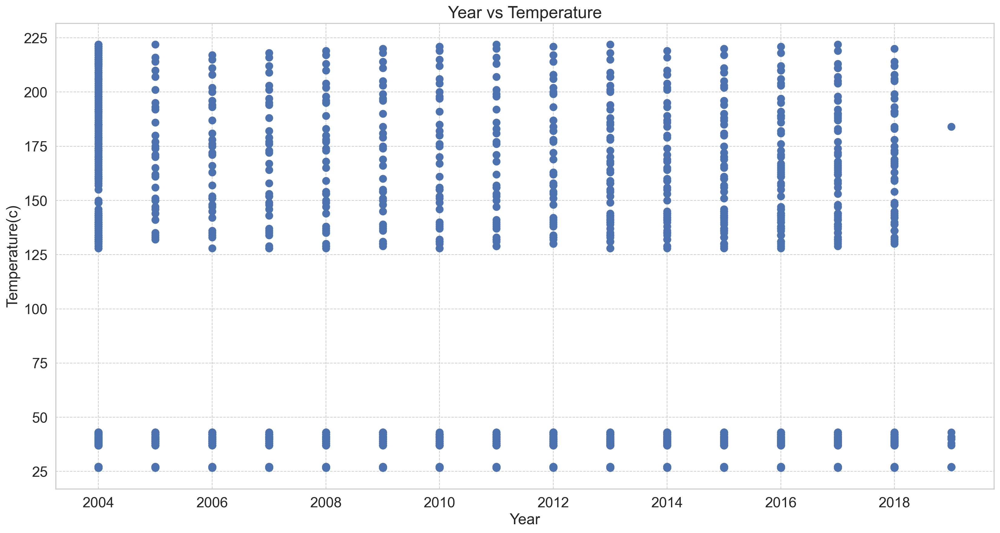

In [27]:
plt.figure(figsize=(20, 10), dpi=200)
plt.scatter(
    x=df["Year"], y=df["Temperature"], s=70
)
plt.title("Year vs Temperature", fontsize=20)
plt.xlabel("Year", fontsize=18)
plt.ylabel("Temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.8)
plt.show()

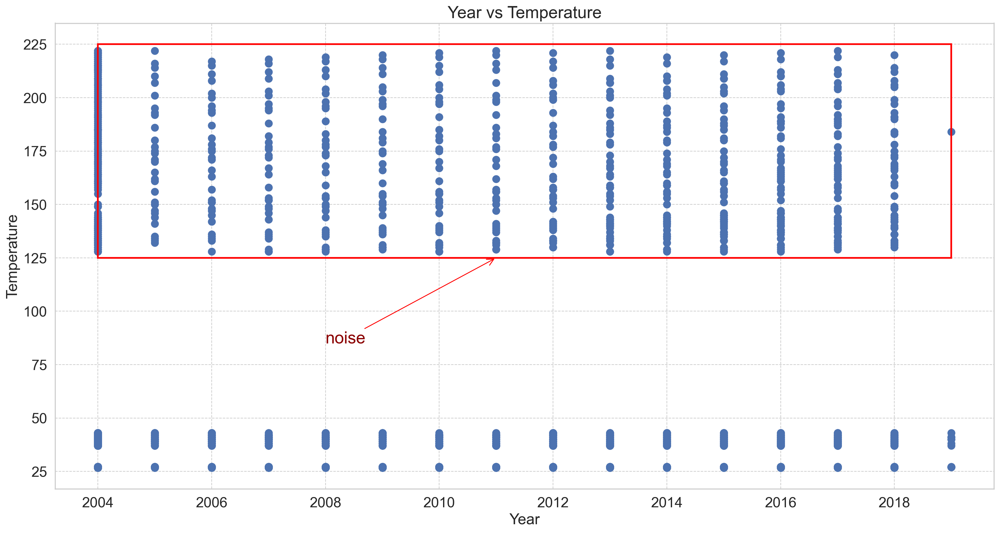

In [28]:
plt.figure(figsize=(20, 10), dpi=200)
plt.scatter(
    x=df["Year"], y=df["Temperature"], s=70
)
plt.title("Year vs Temperature", fontsize=20)
plt.xlabel("Year", fontsize=18)
plt.ylabel("Temperature", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
ax = plt.gca()
rect = Rectangle(
    (2004, 125),
    width=15,
    height=100,
    linewidth=2,
    edgecolor="red",
    facecolor="none",
)
plt.annotate(
    "noise",
    xy=(2011, 125),
    xytext=(2008, 85),
    arrowprops=dict(arrowstyle="->", color="red"),
    fontsize=20,
    color="darkred",
)
ax.add_patch(rect)
plt.grid(True, linestyle="--", linewidth=0.8)
plt.show()

<font face="Times New Roman" size=16>
<br>
Chart Analisys:<br>
Comparing the temperature graph from 2004 to 2019:<br>
There is a range of 25 to 48 which is logical and has a slope of 0, meaning that the temperature has not changed significantly.<br>
But there are a lot of values above 125 in the graph
Do we have a temperature of 125 Celsius in the word?<br>
I read the data Description in Kaggle, it said that the temperature is in Celsius<br>
So we conclude that any values above 60 Celsius are noise<br>
Because so far even in Africa, which is very hot<br>
We have not had temperatures like this

# Main analyses_Part 1

Average annual rainfall in different cities

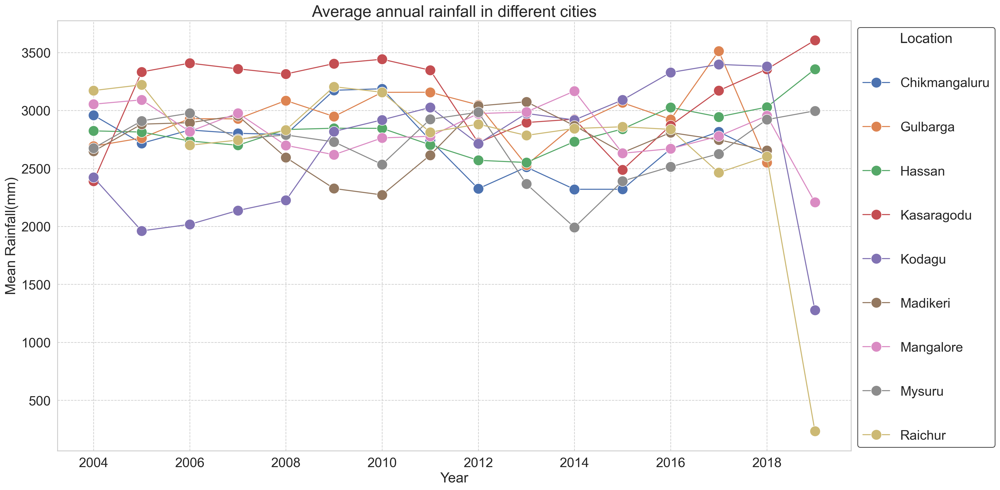

In [29]:
mean_rainfall = df.groupby(["Year", "Location"])["Rainfall"].mean().reset_index()


plt.figure(figsize=(20, 10), dpi=200)
sns.lineplot(
    data=mean_rainfall,
    x="Year",
    y="Rainfall",
    hue="Location",
    marker="o",
    markersize=15,
)

plt.title("Average annual rainfall in different cities", fontsize=23)
plt.xlabel("Year", fontsize=20)
plt.ylabel("Mean Rainfall(mm)", fontsize=20)
plt.legend(
    title="Location",
    title_fontsize=20,
    fontsize=19,
    edgecolor="black",
    bbox_to_anchor=(1, 1),
    labelspacing=2.4,
)
plt.tick_params(axis="both", labelsize=19)
plt.grid(True, linewidth=0.9, linestyle="--")
plt.tight_layout()
plt.show()

<font face="zar" color="warmcool" size=15>Chart Analysis:<br><font>
1. Overall trend over time<br>
Slight increase:<br>'Chikmangalur' and 'Kodagu' cities generally show a slight upward trend from 2004 to 2018.

Relative stability:<br>'Kasaragodu' has maintained high and almost constant rainfall (3200–3500 mm).

Sudden decrease in 2019:<br>
In 2019, almost all cities except 'Kasaragodu' and 'Hassan' show a temporary decrease in rainfall, probably due to a regional drought.<br><br>
Kasaragodu' city has seen a jump from 2400(mm) to 3300(mm), which means there are severe climate changes.<br><br>
'Raichur' city saw a sharp drop from 2018 to 2019, meaning there was probably a drought in the area.

# Examining the average rainfall for each city from 2009 to 2019

In [30]:
df["Location"].value_counts()

Location
Hassan           794
Gulbarga         500
Mangalore        341
Chikmangaluru    338
Madikeri         240
Kasaragodu       229
Raichur          229
Mysuru           222
Kodagu           191
Name: count, dtype: int64

In [31]:
# We want to group by year, rainfall column, and average these
city_Hassan = df[df["Location"] == "Hassan"].groupby(["Year"])["Rainfall"].mean()
print(city_Hassan)

Year
2004    2823.861146
2005    2813.742857
2006    2736.653659
2007    2699.811905
2008    2835.169048
2009    2846.833333
2010    2845.590244
2011    2703.718605
2012    2569.962500
2013    2551.226000
2014    2731.284000
2015    2840.362000
2016    3026.461702
2017    2944.855319
2018    3028.691304
2019    3356.000000
Name: Rainfall, dtype: float64


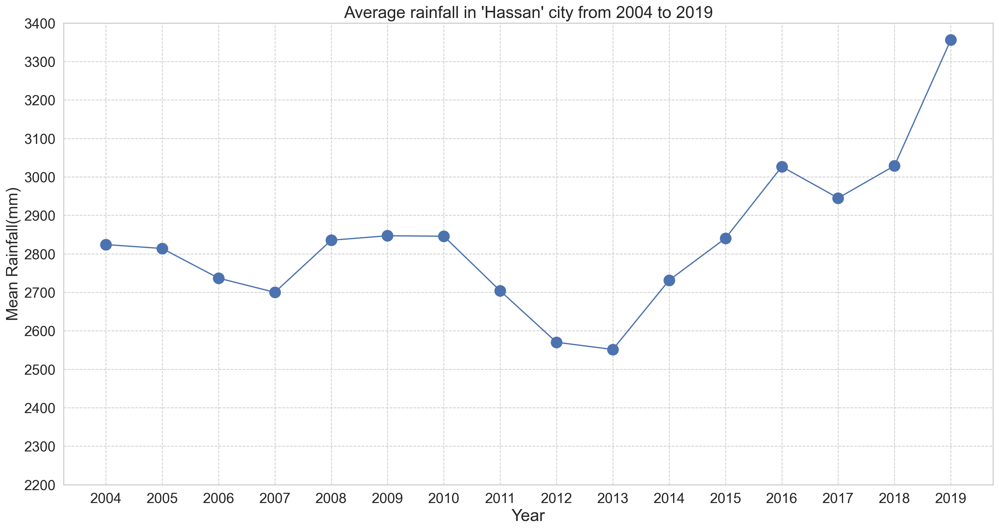

In [32]:
plt.figure(figsize=(20, 10), dpi=200)
city_Hassan.plot(marker='o', markersize=13)
plt.title("Average rainfall in 'Hassan' city from 2004 to 2019", fontsize=20)
plt.xticks(range(2004, 2020, 1))
plt.yticks(range(2200, 3450, 100))
plt.xlabel("Year", fontsize=20)
plt.ylabel("Mean Rainfall(mm)", fontsize=19)
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [33]:
city_Gulbarga = df[df["Location"] == "Gulbarga"].groupby(["Year"])["Rainfall"].mean()
print(city_Gulbarga)

Year
2004    2691.938503
2005    2762.168421
2006    2928.990000
2007    2927.570000
2008    3085.563158
2009    2947.873684
2010    3156.347368
2011    3157.011111
2012    3048.083333
2013    2528.540000
2014    2874.632000
2015    3066.551852
2016    2923.096429
2017    3512.340000
2018    2551.665385
Name: Rainfall, dtype: float64


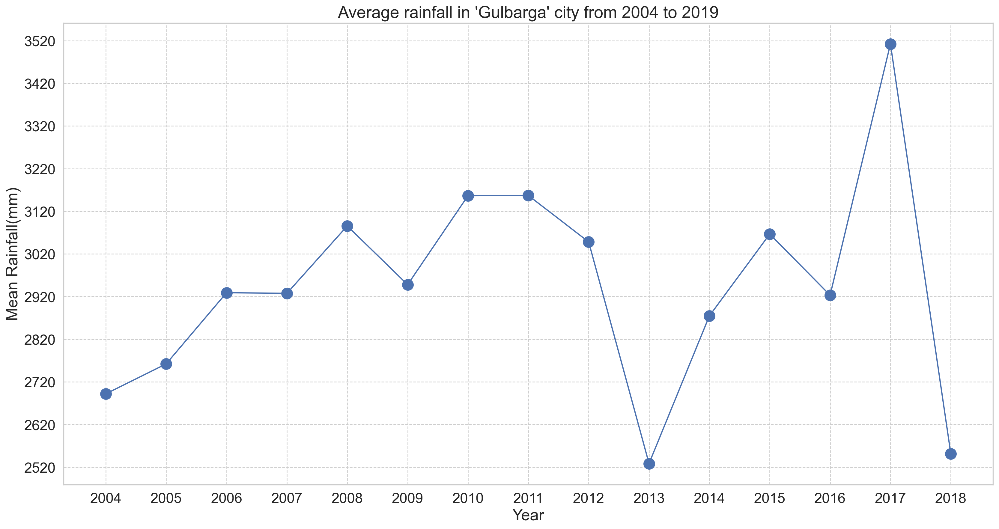

In [34]:
plt.figure(figsize=(20, 10), dpi=200)
city_Gulbarga.plot(marker='o', markersize=13)
plt.title("Average rainfall in 'Gulbarga' city from 2004 to 2019", fontsize=20)
plt.xticks(range(2004, 2019, 1))
plt.yticks(range(2520, 3530, 100))
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean Rainfall(mm)", fontsize=19)
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [35]:
city_Mangalore = df[df["Location"] == "Mangalore"].groupby(["Year"])["Rainfall"].mean()
print(city_Mangalore)

Year
2004    3054.104918
2005    3091.421053
2006    2818.700000
2007    2977.405882
2008    2698.811765
2009    2618.300000
2010    2763.220000
2011    2777.276471
2012    2973.066667
2013    2986.740909
2014    3167.300000
2015    2630.772727
2016    2670.066667
2017    2778.029167
2018    2953.752174
2019    2207.280000
Name: Rainfall, dtype: float64


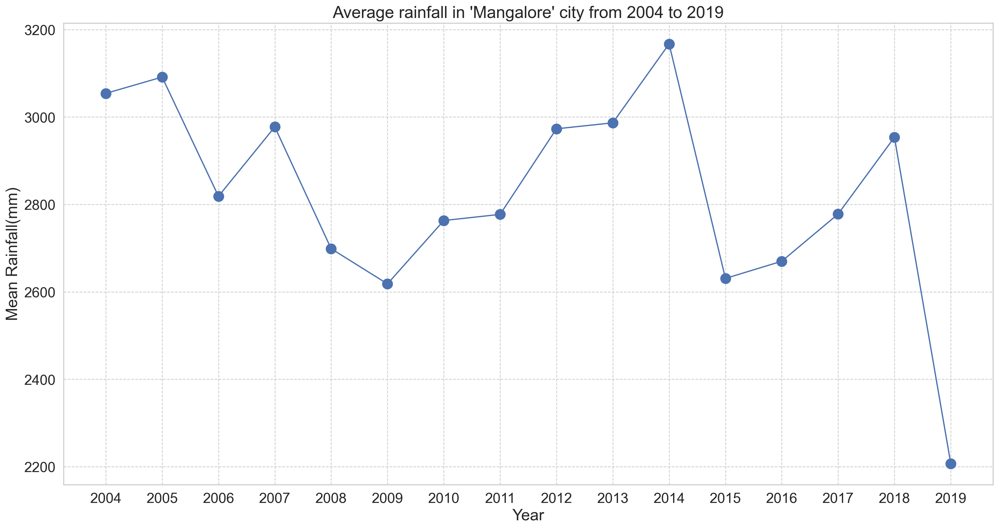

In [36]:
plt.figure(figsize=(20, 10), dpi=200)
city_Mangalore.plot(marker='o', markersize=12)
plt.title("Average rainfall in 'Mangalore' city from 2004 to 2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean Rainfall(mm)", fontsize=19)
plt.xticks(range(2004, 2020, 1))
# plt.yticks(range(2200, 3200, 100))
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [37]:
city_Chikmangaluru = df[df["Location"] == "Chikmangaluru"].groupby(["Year"])["Rainfall"].mean()
print(city_Chikmangaluru)

Year
2004    2958.925980
2005    2716.614286
2006    2831.442857
2007    2802.600000
2008    2792.842857
2009    3173.857143
2010    3187.214286
2011    2743.560000
2012    2325.133333
2013    2511.245455
2014    2319.927273
2015    2320.018182
2016    2668.317647
2017    2816.384211
2018    2611.408333
Name: Rainfall, dtype: float64


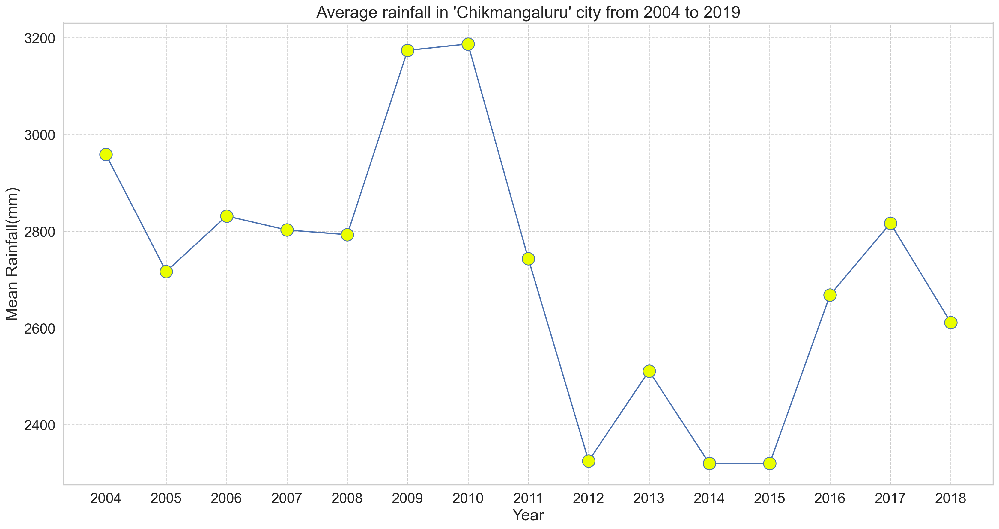

In [38]:
plt.figure(figsize=(20, 10), dpi=200)
city_Chikmangaluru.plot(marker='o', markersize=15, markerfacecolor='#eafe00')
plt.title("Average rainfall in 'Chikmangaluru' city from 2004 to 2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean Rainfall(mm)", fontsize=19)
plt.xticks(range(2004, 2019, 1))
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [39]:
city_Madikeri = df[df["Location"] == "Madikeri"].groupby(["Year"])["Rainfall"].mean()
print(city_Madikeri)

Year
2004    2647.969565
2005    2881.662500
2006    2894.662500
2007    2955.271429
2008    2594.287500
2009    2326.577778
2010    2271.544444
2011    2614.744444
2012    3038.744444
2013    3074.900000
2014    2868.576923
2015    2636.271429
2016    2809.337500
2017    2747.246667
2018    2654.981818
Name: Rainfall, dtype: float64


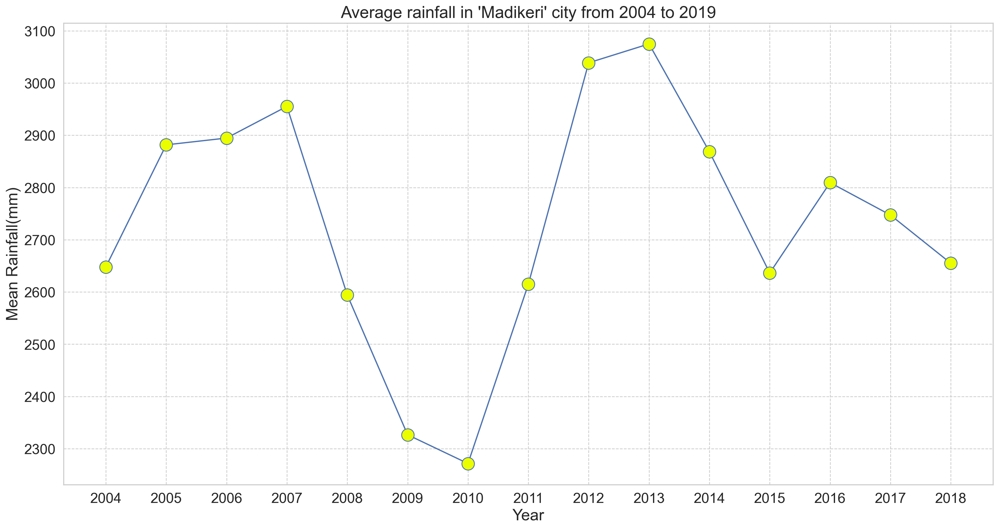

In [40]:
plt.figure(figsize=(20, 10), dpi=200)
city_Madikeri.plot(marker='o', markersize=15, markerfacecolor='#eafe00')
plt.title("Average rainfall in 'Madikeri' city from 2004 to 2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean Rainfall(mm)", fontsize=19)
plt.xticks(range(2004, 2019, 1))
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [41]:
city_Kasaragodu = df[df["Location"] == "Kasaragodu"].groupby(["Year"])["Rainfall"].mean()
print(city_Kasaragodu)

Year
2004    2389.772131
2005    3332.475000
2006    3408.025000
2007    3358.837500
2008    3314.662500
2009    3404.262500
2010    3441.825000
2011    3347.225000
2012    2721.862500
2013    2895.893333
2014    2924.753333
2015    2487.811765
2016    2870.900000
2017    3170.605000
2018    3356.006250
2019    3605.400000
Name: Rainfall, dtype: float64


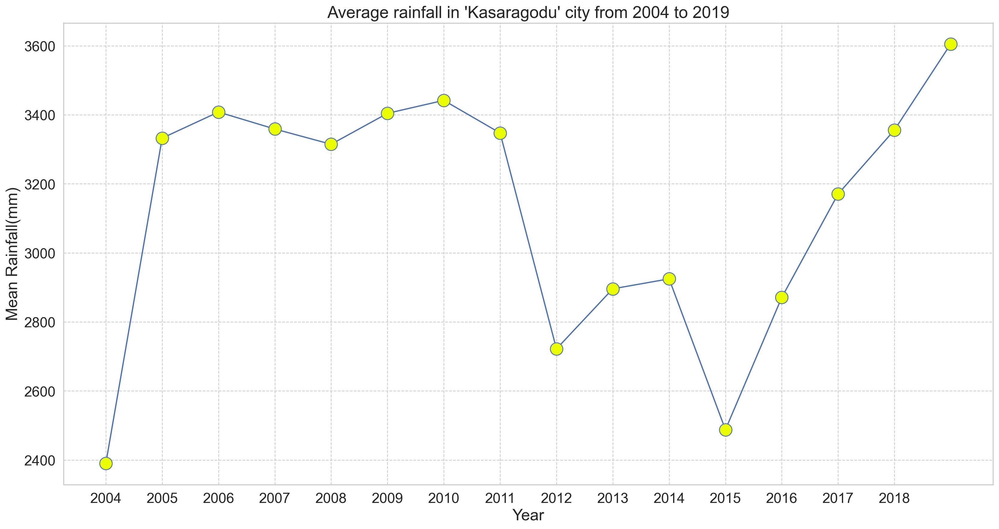

In [42]:
plt.figure(figsize=(20, 10), dpi=200)
city_Kasaragodu.plot(marker='o', markersize=15, markerfacecolor='#eafe00')
plt.title("Average rainfall in 'Kasaragodu' city from 2004 to 2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean Rainfall(mm)", fontsize=19)
plt.xticks(range(2004, 2019, 1))
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [43]:
city_Raichur = df[df["Location"] == "Raichur"].groupby(["Year"])["Rainfall"].mean()
print(city_Raichur)

Year
2004    3171.803529
2005    3221.162500
2006    2699.971429
2007    2744.300000
2008    2831.985714
2009    3204.583333
2010    3157.466667
2011    2812.257143
2012    2881.462500
2013    2784.785714
2014    2844.461538
2015    2859.266667
2016    2836.711765
2017    2463.644444
2018    2602.223077
2019     234.000000
Name: Rainfall, dtype: float64


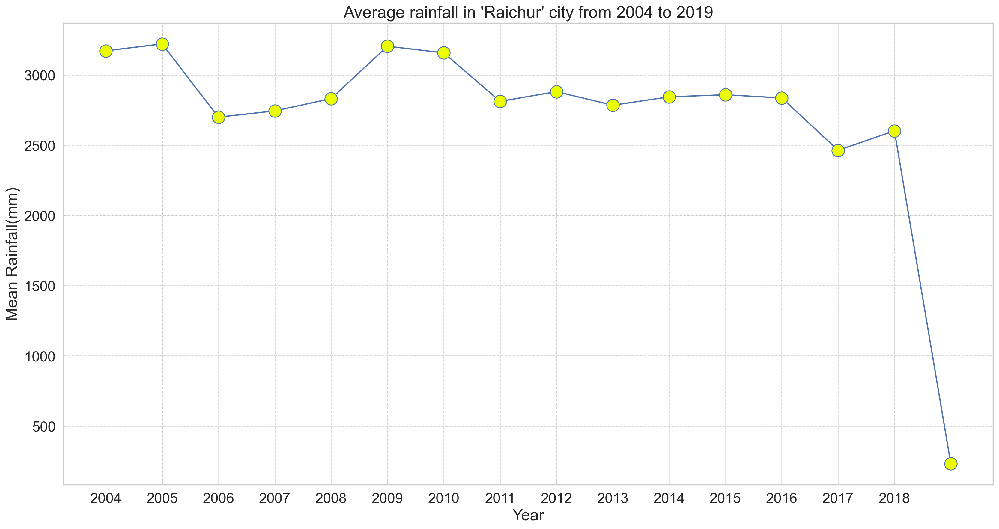

In [44]:
plt.figure(figsize=(20, 10), dpi=200)
city_Raichur.plot(marker='o', markersize=15, markerfacecolor='#eafe00')
plt.title("Average rainfall in 'Raichur' city from 2004 to 2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean Rainfall(mm)", fontsize=19)
plt.xticks(range(2004, 2019, 1))
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [45]:
city_Mysuru = df[df["Location"] == "Mysuru"].groupby(["Year"])["Rainfall"].mean()
print(city_Mysuru)

Year
2004    2675.109091
2005    2909.670000
2006    2976.311111
2007    2753.820000
2008    2788.670000
2009    2729.044444
2010    2534.600000
2011    2923.622222
2012    2984.727273
2013    2366.194737
2014    1991.900000
2015    2391.033333
2016    2514.284615
2017    2625.903846
2018    2921.185714
2019    2996.600000
Name: Rainfall, dtype: float64


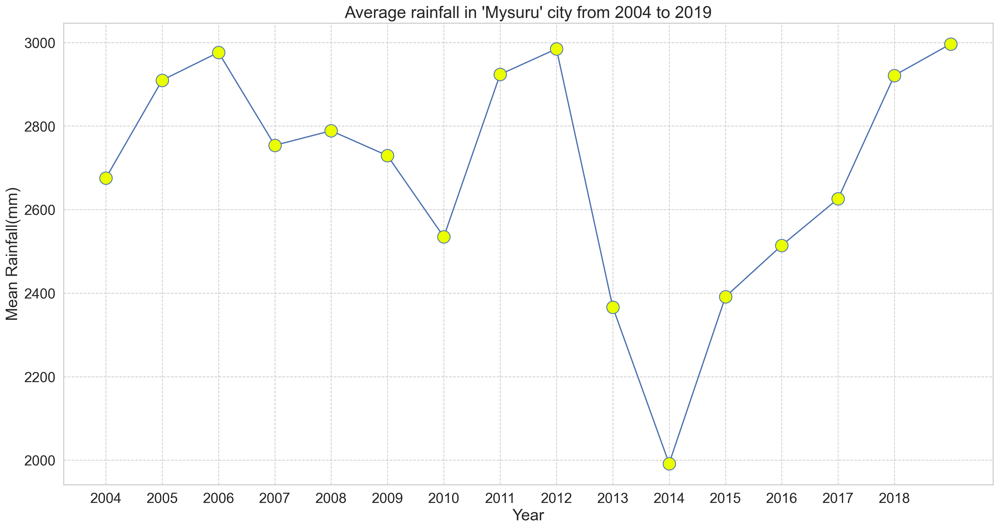

In [46]:
plt.figure(figsize=(20, 10), dpi=200)
city_Mysuru.plot(marker='o', markersize=15, markerfacecolor='#eafe00')
plt.title("Average rainfall in 'Mysuru' city from 2004 to 2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean Rainfall(mm)", fontsize=19)
plt.xticks(range(2004, 2019, 1))
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [47]:
city_Kodagu = df[df["Location"] == "Kodagu"].groupby(["Year"])["Rainfall"].mean()
print(city_Kodagu)

Year
2004    2422.362500
2005    1961.057143
2006    2017.257143
2007    2136.800000
2008    2224.500000
2009    2818.628571
2010    2918.777778
2011    3025.854545
2012    2712.818182
2013    2974.253846
2014    2918.130769
2015    3090.491667
2016    3327.708333
2017    3397.130769
2018    3380.792308
2019    1276.333333
Name: Rainfall, dtype: float64


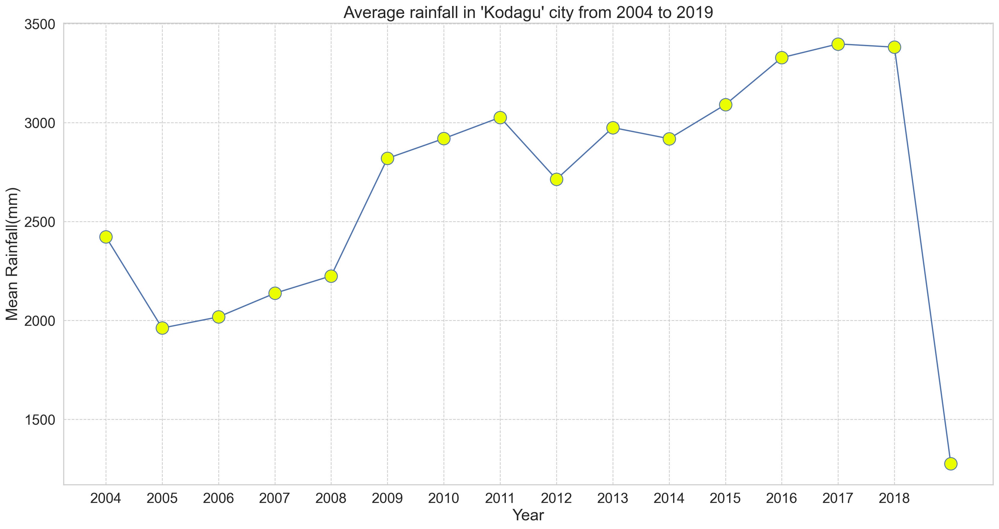

In [48]:
plt.figure(figsize=(20, 10), dpi=200)
city_Kodagu.plot(marker='o', markersize=15, markerfacecolor='#eafe00')
plt.title("Average rainfall in 'Kodagu' city from 2004 to 2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean Rainfall(mm)", fontsize=19)
plt.xticks(range(2004, 2019, 1))
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

<font face="zar" size=15>
<br>
I couldn't do anything with the temperature column and of course it has a lot of noise and if I knew the data source I would have filled it with the correct values
So I'm removing the noise values

In [49]:
df = df[df["Temperature"] < 50]
df

,Year,Location,Area,Rainfall,Temperature,Soil type,Irrigation,yeilds,Humidity,Crops,price,Season
0,2004,Mangalore,1279.0,2903.1,27.0,Alluvial,Drip,2570.0,57.0,Coconut,200000.0,Kharif
1,2004,Mangalore,13283.0,2903.1,27.0,Alluvial,Drip,27170.0,57.5,Coconut,4847.0,Kharif
2,2004,Mangalore,52119.0,2903.1,27.0,Alluvial,Drip,114744.0,57.0,Coconut,51239.0,Kharif
3,2004,Mangalore,725.0,2996.6,27.0,Alluvial,Drip,1402.0,55.0,Coconut,216396.0,Kharif
4,2004,Mangalore,12885.0,2996.6,27.0,Alluvial,Drip,23456.0,56.0,Coconut,2644.0,Kharif
...,...,...,...,...,...,...,...,...,...,...,...,...
3045,2017,Kasaragodu,17.0,2903.1,42.0,Alluvial,Basin,3830.0,55.0,Arecanut,4847.0,Zaid
3046,2018,Kasaragodu,3.0,2903.1,42.0,Alluvial,Basin,4.0,56.0,Arecanut,51239.0,Zaid
3047,2004,Kasaragodu,9.0,2903.1,42.0,Alluvial,Basin,9.0,54.0,Arecanut,216396.0,Zaid
3048,2005,Kasaragodu,21.0,2996.6,43.0,Alluvial,Basin,12.0,58.0,Arecanut,2644.0,Zaid


### now check data in 'Temperature' columns

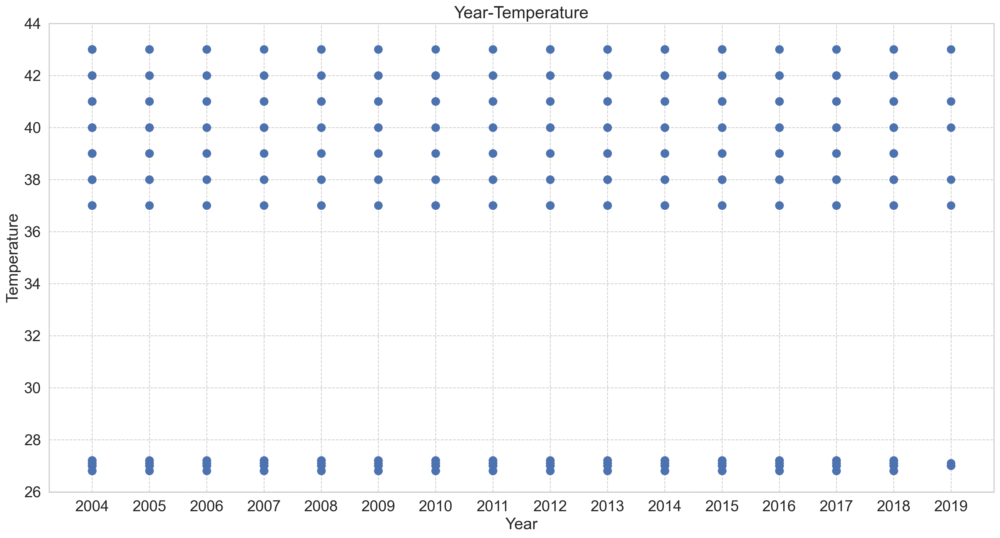

In [50]:
plt.figure(figsize=(20, 10), dpi=200)
plt.scatter(
    x=df["Year"], y=df["Temperature"], marker='o', s=80
)
plt.title("Year-Temperature", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Temperature", fontsize=19)
plt.xticks(range(2004, 2020, 1))
plt.yticks(range(26, 46, 2))
plt.tick_params(axis="both", labelsize=18)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

Some of the lower samples are 26 degrees and are between 2004 and 2019<br>
Some of the columnar samples from 2004 to 2019 are between 37 and 43.

2019 has fewer points than the others.

This may be a sign of missing or incomplete data.

<font size=22>
The data is very asymmetric.<br>Some data for the city was recorded 1 time, some were recorded 700 times!!!!<br>
The temperature column is completely uniform and has no real variation.

In [51]:
# group by location and see mean temp
mean_temp_loc = df.groupby(["Location"])["Temperature"].mean()
mean_temp_loc.sort_values(inplace=True, ascending=False)
mean_temp_loc

Location
Kasaragodu       35.073750
Raichur          33.532941
Gulbarga         32.939831
Mangalore        32.690123
Mysuru           32.448768
Hassan           32.391781
Chikmangaluru    32.211310
Madikeri         31.495620
Kodagu           31.468831
Name: Temperature, dtype: float64

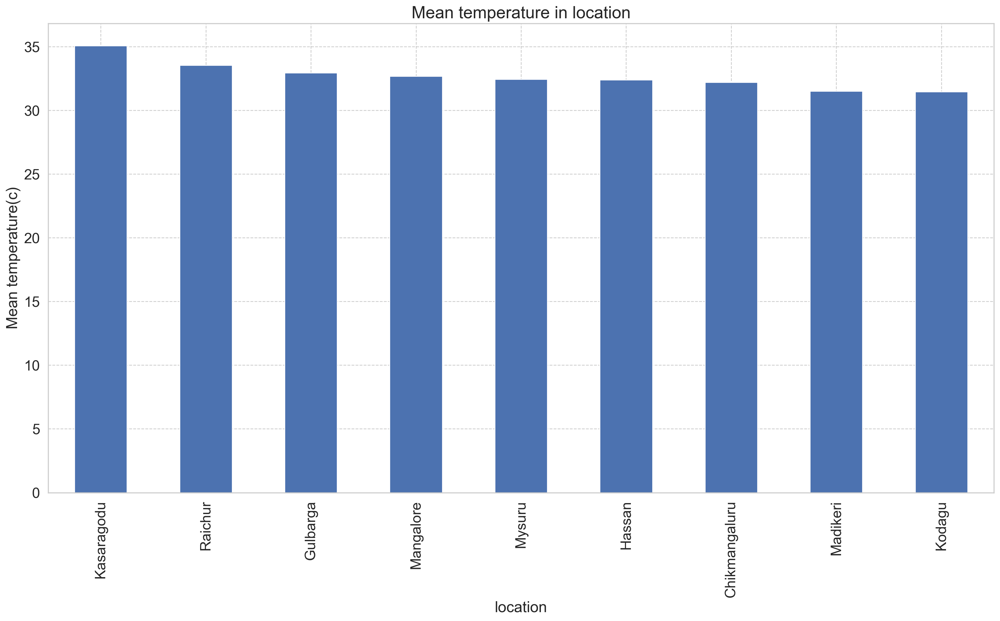

In [52]:
plt.figure(figsize=(20, 10), dpi=200)
mean_temp_loc.plot(kind="bar")
plt.title("Mean temperature in location", fontsize=20)
plt.xlabel("location", fontsize=18)
plt.ylabel("Mean temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

Kasaragodu city had a higher average temperature.<br>Kodagu city had a lower average temperature and was cooler.

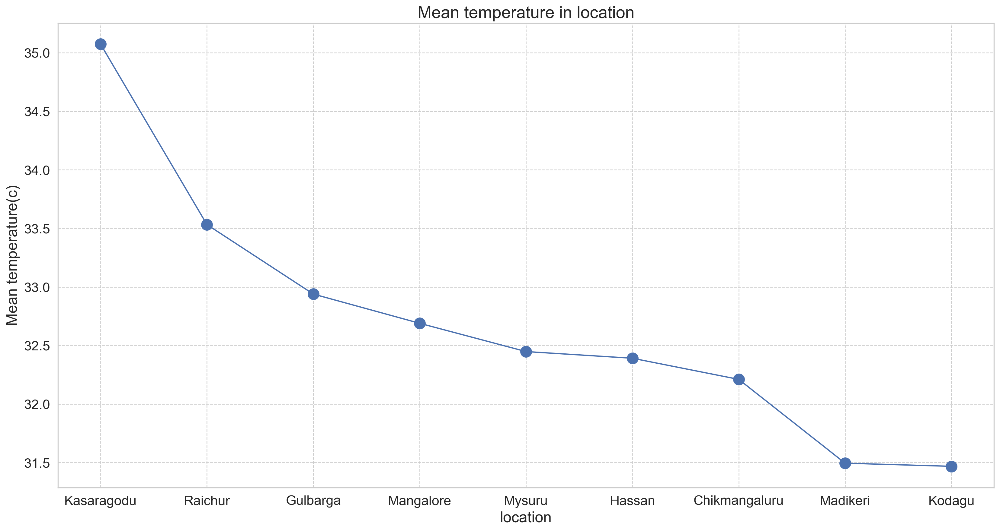

In [53]:
plt.figure(figsize=(20, 10), dpi=200)
plt.plot(mean_temp_loc.index, mean_temp_loc, marker='o', markersize=13)
plt.title("Mean temperature in location", fontsize=20)
plt.xlabel("location", fontsize=18)
plt.ylabel("Mean temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=16)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

<font size=15>Chart Analysis:<font>
<br>
The average temperature of 'Kodagu' city is lower than other cities<br>
The average temperature of 'Kasaragodu' city is higher<br>
So 'Kodagu' city is cooler than other cities<br>

## Now it's time to compare the average temperatures in each city.

In [54]:
city_Kasaragodu_temp = df[df["Location"] == "Kasaragodu"].groupby(["Year"])["Temperature"].mean()
city_Kasaragodu_temp.sort_values(inplace=True, ascending=True)
city_Kasaragodu_temp.sort_index(inplace=True)

In [55]:
print(city_Kasaragodu_temp)

Year
2004    35.361111
2005    38.333333
2006    37.400000
2007    36.250000
2008    36.750000
2009    33.050000
2010    33.350000
2011    32.320000
2012    29.520000
2013    34.310000
2014    34.600000
2015    35.063636
2016    35.692857
2017    34.814286
2018    35.660000
Name: Temperature, dtype: float64


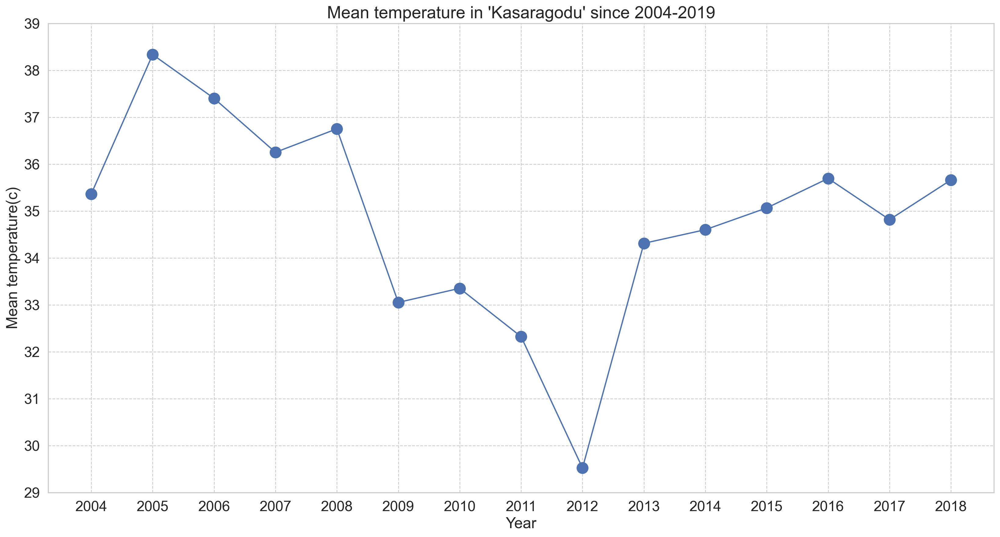

In [56]:
plt.figure(figsize=(20, 10), dpi=200)
city_Kasaragodu_temp.plot(marker='o', markersize=13)
plt.title("Mean temperature in 'Kasaragodu' since 2004-2019", fontsize=20)
plt.xlabel("Year", fontsize=18)
plt.ylabel("Mean temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(range(2004, 2019, 1))
plt.yticks(range(29, 40, 1))
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [57]:
city_Raichur_temp = df[df["Location"] == "Raichur"].groupby(["Year"])["Temperature"].mean()
city_Raichur_temp.sort_values(inplace=True, ascending=True)
city_Raichur_temp.sort_index(inplace=True)

In [58]:
print(city_Raichur_temp)

Year
2004    32.747143
2005    42.000000
2009    42.000000
2010    42.000000
2011    43.000000
2012    42.500000
2013    42.000000
2014    35.000000
2015    35.000000
2016    27.000000
2018    34.000000
2019    27.000000
Name: Temperature, dtype: float64


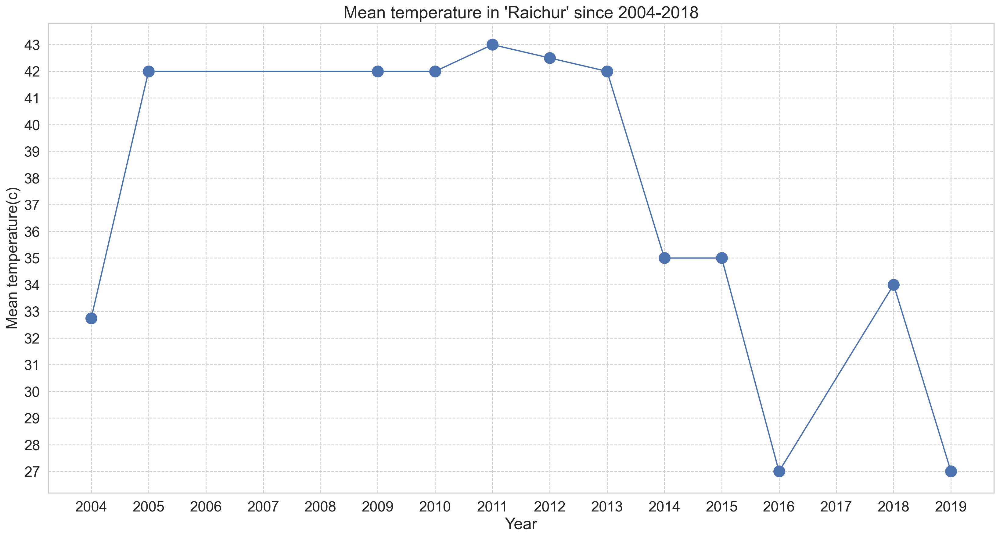

In [59]:
plt.figure(figsize=(20, 10), dpi=200)
city_Raichur_temp.plot(marker='o', markersize=13)
plt.title("Mean temperature in 'Raichur' since 2004-2018", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(range(2004, 2020, 1))
plt.yticks(range(27, 44, 1))
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

<font size=13 color="red">
Note: There is no data between 2006 and 2008.

In [60]:
city_Gulbarga_temp = df[df["Location"] == "Gulbarga"].groupby(["Year"])["Temperature"].mean()
city_Gulbarga_temp.sort_values(inplace=True, ascending=True)
city_Gulbarga_temp.sort_index(inplace=True)

In [61]:
print(city_Gulbarga_temp)

Year
2004    33.034959
2005    34.914286
2006    33.912500
2007    32.900000
2008    31.366667
2009    29.580000
2010    29.820000
2011    29.800000
2012    31.840000
2013    33.110000
2014    34.210000
2015    33.663636
2016    33.563636
2017    33.183333
2018    32.745455
Name: Temperature, dtype: float64


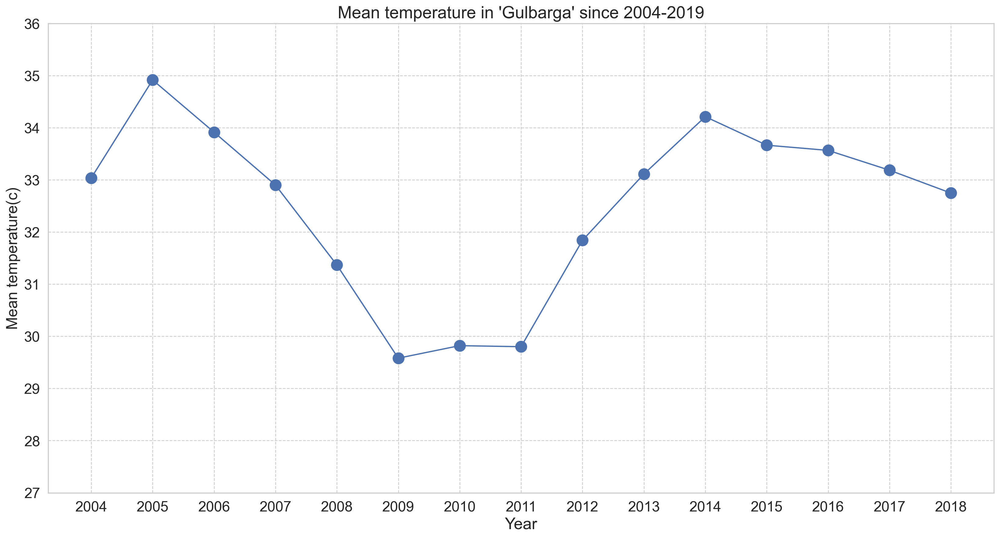

In [62]:
plt.figure(figsize=(20, 10), dpi=200)
city_Gulbarga_temp.plot(marker='o', markersize=13)
plt.title("Mean temperature in 'Gulbarga' since 2004-2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(range(2004, 2019, 1))
plt.yticks(range(27, 37, 1))
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [63]:
city_Mangalore_temp = df[df["Location"] == "Mangalore"].groupby(["Year"])["Temperature"].mean()
city_Mangalore_temp.sort_values(inplace=True, ascending=True)
city_Mangalore_temp.sort_index(inplace=True)

In [64]:
print(city_Mangalore_temp)

Year
2004    32.078333
2005    32.994444
2006    31.600000
2007    31.450000
2008    31.493750
2009    31.893333
2010    31.907143
2011    30.937500
2012    33.260000
2013    34.190476
2014    33.600000
2015    32.955000
2016    33.326087
2017    34.017391
2018    33.890909
2019    32.600000
Name: Temperature, dtype: float64


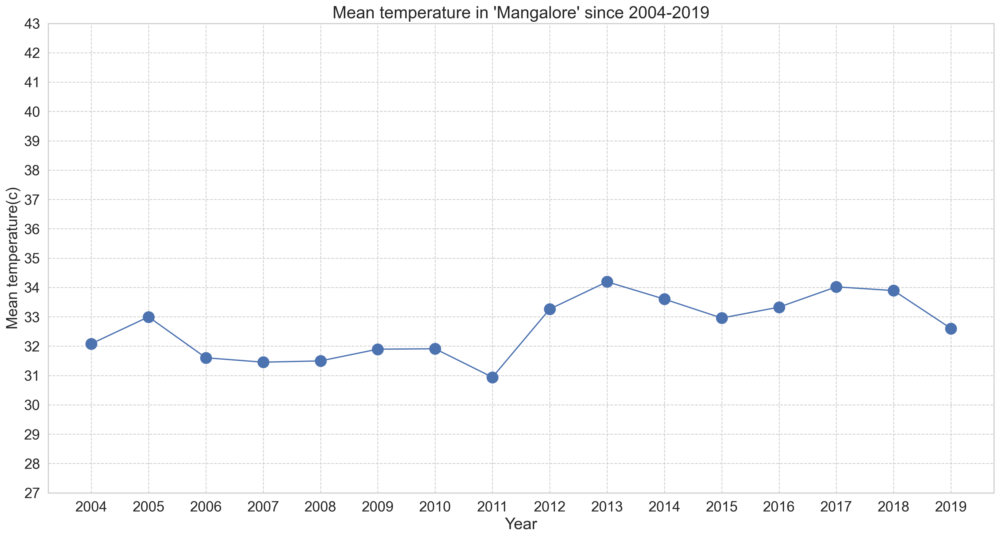

In [65]:
plt.figure(figsize=(20, 10), dpi=200)
city_Mangalore_temp.plot(marker='o', markersize=13)
plt.title("Mean temperature in 'Mangalore' since 2004-2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(range(2004, 2020, 1))
plt.yticks(range(27, 44, 1))
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [66]:
city_Mysuru_temp = df[df["Location"] == "Mysuru"].groupby(["Year"])["Temperature"].mean()
city_Mysuru_temp.sort_values(inplace=True, ascending=True)
city_Mysuru_temp.sort_index(inplace=True)

In [67]:
print(city_Mysuru_temp)

Year
2004    31.630000
2005    31.022222
2006    31.133333
2007    31.266667
2008    32.488889
2009    33.300000
2010    33.400000
2011    33.650000
2012    34.455556
2013    32.958824
2014    32.205882
2015    31.721053
2016    32.520833
2017    31.824000
2018    32.855000
2019    40.500000
Name: Temperature, dtype: float64


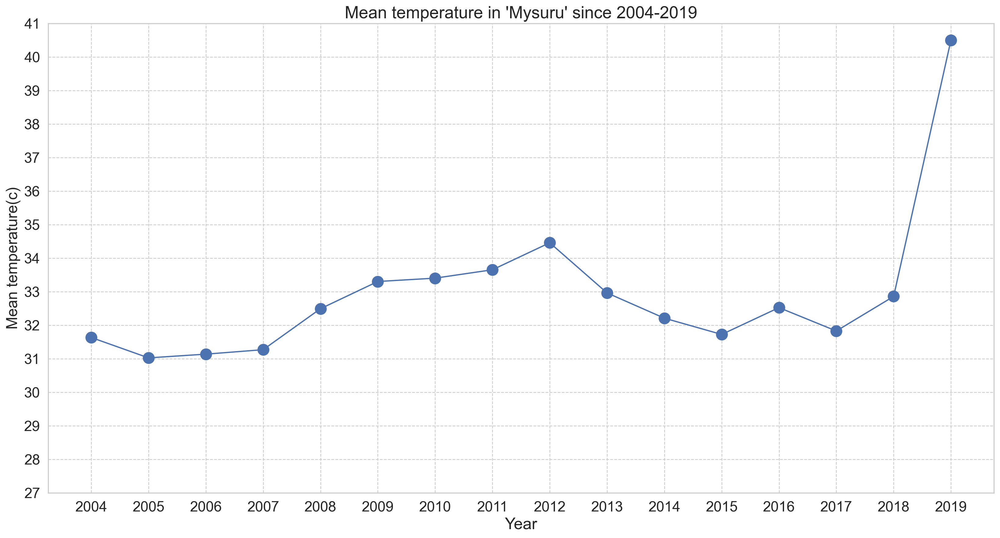

In [68]:
plt.figure(figsize=(20, 10), dpi=200)
city_Mysuru_temp.plot(marker='o', markersize=13)
plt.title("Mean temperature in 'Mysuru' since 2004-2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(range(2004, 2020, 1))
plt.yticks(range(27, 42, 1))
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [69]:
city_Hassan_temp = df[df["Location"] == "Hassan"].groupby(["Year"])["Temperature"].mean()
city_Hassan_temp.sort_values(inplace=True, ascending=True)
city_Hassan_temp.sort_index(inplace=True)

In [70]:
print(city_Hassan_temp)

Year
2004    32.559459
2005    32.700000
2006    32.836842
2007    32.330769
2008    31.813158
2009    31.889474
2010    31.721622
2011    32.710256
2012    33.036364
2013    33.058696
2014    32.913043
2015    32.342222
2016    31.792857
2017    31.738095
2018    31.700000
2019    33.000000
Name: Temperature, dtype: float64


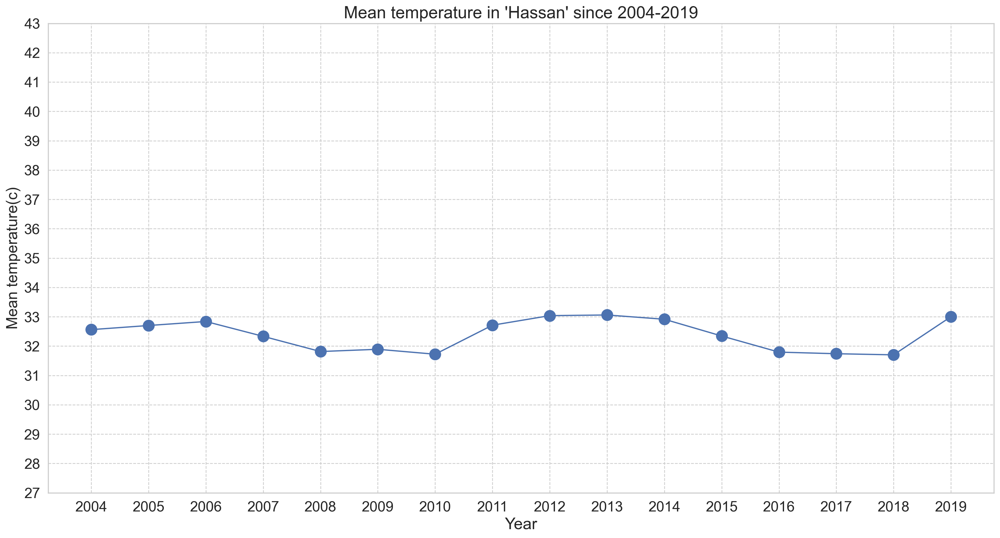

In [71]:
plt.figure(figsize=(20, 10), dpi=200)
city_Hassan_temp.plot(marker='o', markersize=13)
plt.title("Mean temperature in 'Hassan' since 2004-2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(range(2004, 2020, 1))
plt.yticks(range(27, 44, 1))
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [72]:
city_Chikmangaluru_temp = df[df["Location"] == "Chikmangaluru"].groupby(["Year"])["Temperature"].mean()
city_Chikmangaluru_temp.sort_values(inplace=True, ascending=True)
city_Chikmangaluru_temp.sort_index(inplace=True)

In [73]:
print(city_Chikmangaluru_temp)

Year
2004    31.234653
2005    32.185714
2006    32.457143
2007    32.442857
2008    32.585714
2009    32.828571
2010    34.257143
2011    31.800000
2012    35.533333
2013    33.663636
2014    33.709091
2015    34.072727
2016    33.600000
2017    34.926316
2018    34.450000
Name: Temperature, dtype: float64


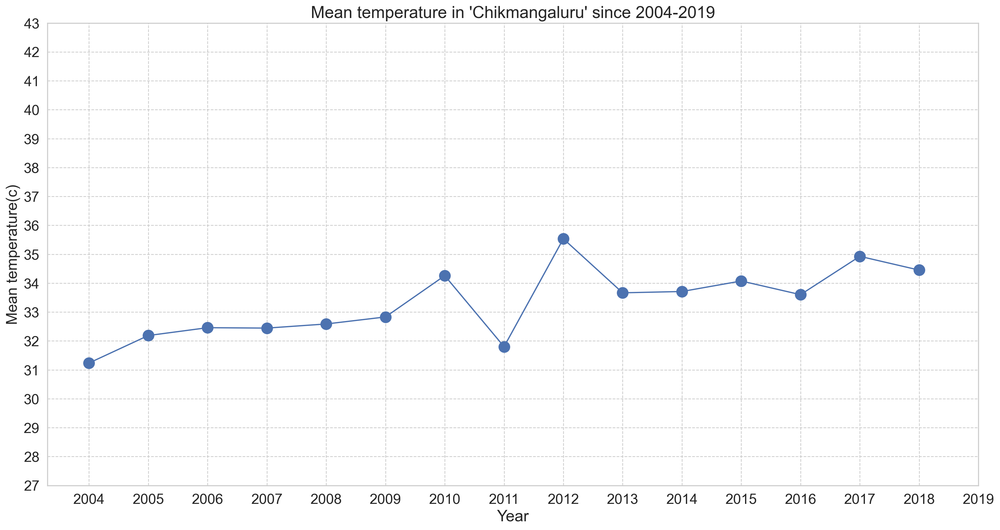

In [74]:
plt.figure(figsize=(20, 10), dpi=200)
city_Chikmangaluru_temp.plot(marker='o', markersize=13)
plt.title("Mean temperature in 'Chikmangaluru' since 2004-2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(range(2004, 2020, 1))
plt.yticks(range(27, 44, 1))
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [75]:
city_Madikeri_temp = df[df["Location"] == "Madikeri"].groupby(["Year"])["Temperature"].mean()
city_Madikeri_temp.sort_values(inplace=True, ascending=True)
city_Madikeri_temp.sort_index(inplace=True)

In [76]:
print(city_Madikeri_temp)

Year
2004    32.493617
2005    27.000000
2006    27.000000
2007    26.933333
2008    33.550000
2009    31.640000
2010    31.680000
2011    32.060000
2012    32.060000
2013    31.512500
2014    31.775000
2015    31.377778
2016    30.763636
2017    31.754545
2018    30.387500
Name: Temperature, dtype: float64


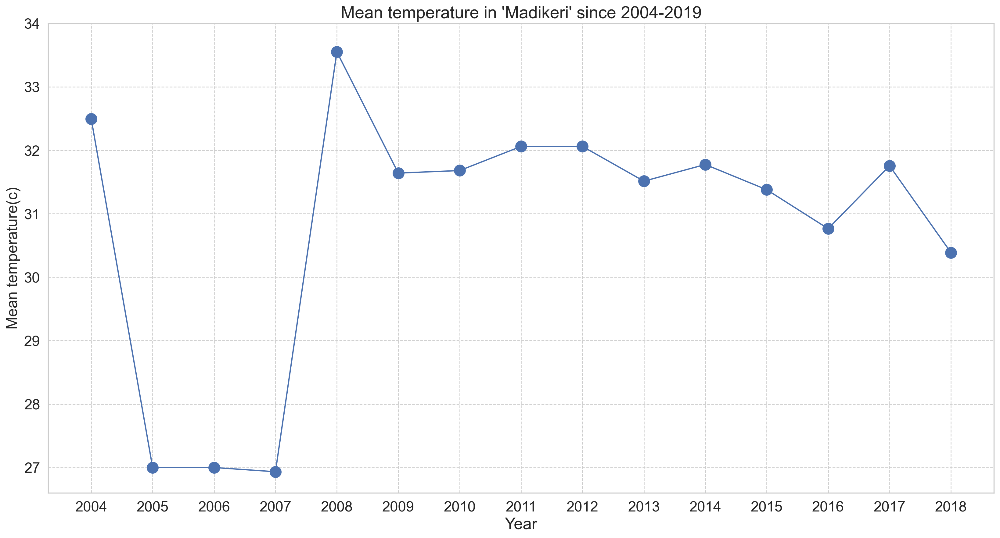

In [77]:
plt.figure(figsize=(20, 10), dpi=200)
city_Madikeri_temp.plot(marker='o', markersize=13)
plt.title("Mean temperature in 'Madikeri' since 2004-2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(range(2004, 2019, 1))
plt.yticks(range(27, 35, 1))
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [78]:
city_Kodagu_temp = df[df["Location"] == "Kodagu"].groupby(["Year"])["Temperature"].mean()
city_Kodagu_temp.sort_values(inplace=True, ascending=True)
city_Kodagu_temp.sort_index(inplace=True)

In [79]:
print(city_Kodagu_temp)

Year
2004    29.108511
2005    33.300000
2006    36.300000
2007    33.633333
2008    35.533333
2009    34.600000
2010    32.314286
2011    31.725000
2012    33.250000
2013    31.355556
2014    31.400000
2015    32.257143
2016    32.200000
2017    31.011111
2018    31.222222
2019    27.066667
Name: Temperature, dtype: float64


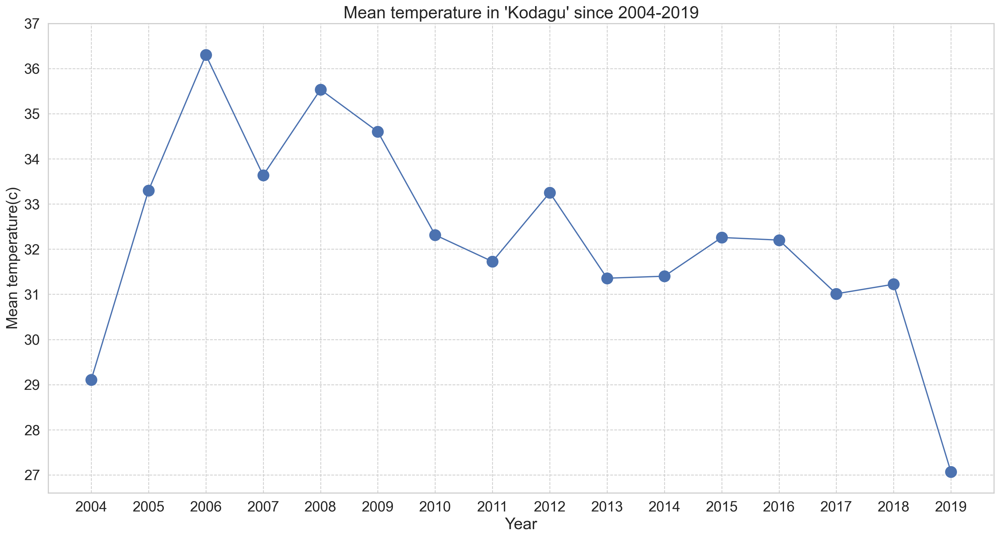

In [80]:
plt.figure(figsize=(20, 10), dpi=200)
city_Kodagu_temp.plot(marker='o', markersize=13)
plt.title("Mean temperature in 'Kodagu' since 2004-2019", fontsize=20)
plt.xlabel("Year", fontsize=19)
plt.ylabel("Mean temperature(c)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.xticks(range(2004, 2020, 1))
plt.yticks(range(27, 38, 1))
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

## Now it's time for 2 columns that are worth discussing:
<font face="zar" size=12>
'Area' column and 'yields' column:<br>
From my searches and research I did:<br>
1) 'yields':<br>It is a standard measure of the amount of agricultural production harvested per unit area of land.(Needs comparison with area column)<br>
In India this unit is Kilograms per hectare (kg/ha)<br>
I am converting it to tonnes per hectare for easier analysis
<font>

<font size=8>
A "biga" is not a standardized unit of measurement, and its size can vary depending on the region. However, one hectare is equivalent to approximately 3.95 Bigha. To be more precise, 1 hectare equals roughly 3.9544 Bigha, or conversely, 1 Bigha is about 0.2529 hectares

<font size=20>
Throughout the world, the unit of land area is the hectare,<br>and the unit of crop yield is tons per hectare.👇

In [81]:
df["yeilds"] = df["yeilds"] / 1000  # Convert yields column values to tons

C:\Users\hosse\AppData\Local\Temp\ipykernel_13356\3142182941.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["yeilds"] = df["yeilds"] / 1000  # Convert yields column values to tons


<font size=15 face="zar">
note:<br>
Because a biga is not an exact unit, I omitted converting the area of a biga to a hectare.

In [82]:
df

,Year,Location,Area,Rainfall,Temperature,Soil type,Irrigation,yeilds,Humidity,Crops,price,Season
0,2004,Mangalore,1279.0,2903.1,27.0,Alluvial,Drip,2.570,57.0,Coconut,200000.0,Kharif
1,2004,Mangalore,13283.0,2903.1,27.0,Alluvial,Drip,27.170,57.5,Coconut,4847.0,Kharif
2,2004,Mangalore,52119.0,2903.1,27.0,Alluvial,Drip,114.744,57.0,Coconut,51239.0,Kharif
3,2004,Mangalore,725.0,2996.6,27.0,Alluvial,Drip,1.402,55.0,Coconut,216396.0,Kharif
4,2004,Mangalore,12885.0,2996.6,27.0,Alluvial,Drip,23.456,56.0,Coconut,2644.0,Kharif
...,...,...,...,...,...,...,...,...,...,...,...,...
3045,2017,Kasaragodu,17.0,2903.1,42.0,Alluvial,Basin,3.830,55.0,Arecanut,4847.0,Zaid
3046,2018,Kasaragodu,3.0,2903.1,42.0,Alluvial,Basin,0.004,56.0,Arecanut,51239.0,Zaid
3047,2004,Kasaragodu,9.0,2903.1,42.0,Alluvial,Basin,0.009,54.0,Arecanut,216396.0,Zaid
3048,2005,Kasaragodu,21.0,2996.6,43.0,Alluvial,Basin,0.012,58.0,Arecanut,2644.0,Zaid


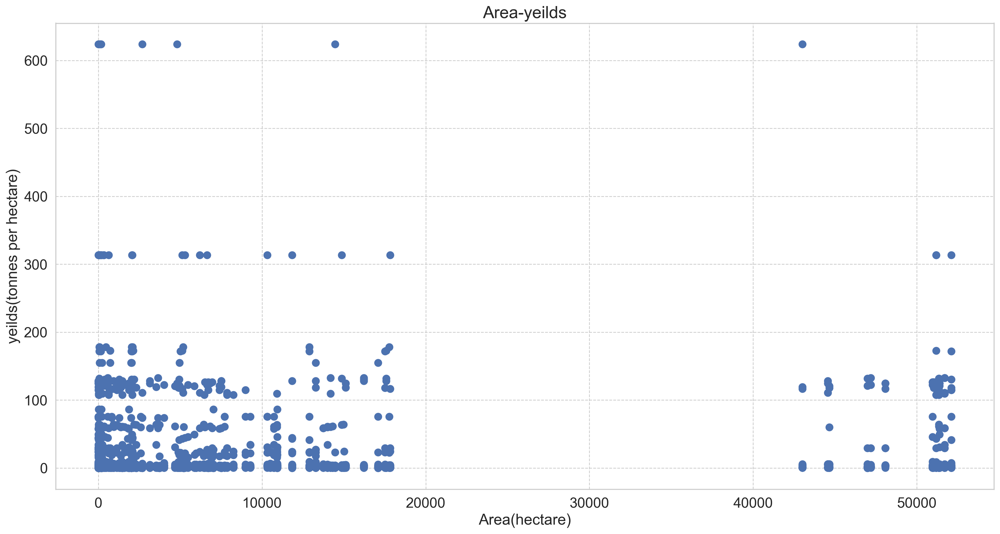

In [83]:
plt.figure(figsize=(20, 10), dpi=200)
plt.scatter(
    x=df["Area"], y=df["yeilds"], s=70 
)
plt.title("Area-yeilds", fontsize=20)
plt.xlabel("Area(hectare)", fontsize=18)
plt.ylabel("yeilds(tonnes per hectare)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

In [84]:
df = df[df["yeilds"] < 200]
df

,Year,Location,Area,Rainfall,Temperature,Soil type,Irrigation,yeilds,Humidity,Crops,price,Season
0,2004,Mangalore,1279.0,2903.1,27.0,Alluvial,Drip,2.570,57.0,Coconut,200000.0,Kharif
1,2004,Mangalore,13283.0,2903.1,27.0,Alluvial,Drip,27.170,57.5,Coconut,4847.0,Kharif
2,2004,Mangalore,52119.0,2903.1,27.0,Alluvial,Drip,114.744,57.0,Coconut,51239.0,Kharif
3,2004,Mangalore,725.0,2996.6,27.0,Alluvial,Drip,1.402,55.0,Coconut,216396.0,Kharif
4,2004,Mangalore,12885.0,2996.6,27.0,Alluvial,Drip,23.456,56.0,Coconut,2644.0,Kharif
...,...,...,...,...,...,...,...,...,...,...,...,...
3045,2017,Kasaragodu,17.0,2903.1,42.0,Alluvial,Basin,3.830,55.0,Arecanut,4847.0,Zaid
3046,2018,Kasaragodu,3.0,2903.1,42.0,Alluvial,Basin,0.004,56.0,Arecanut,51239.0,Zaid
3047,2004,Kasaragodu,9.0,2903.1,42.0,Alluvial,Basin,0.009,54.0,Arecanut,216396.0,Zaid
3048,2005,Kasaragodu,21.0,2996.6,43.0,Alluvial,Basin,0.012,58.0,Arecanut,2644.0,Zaid


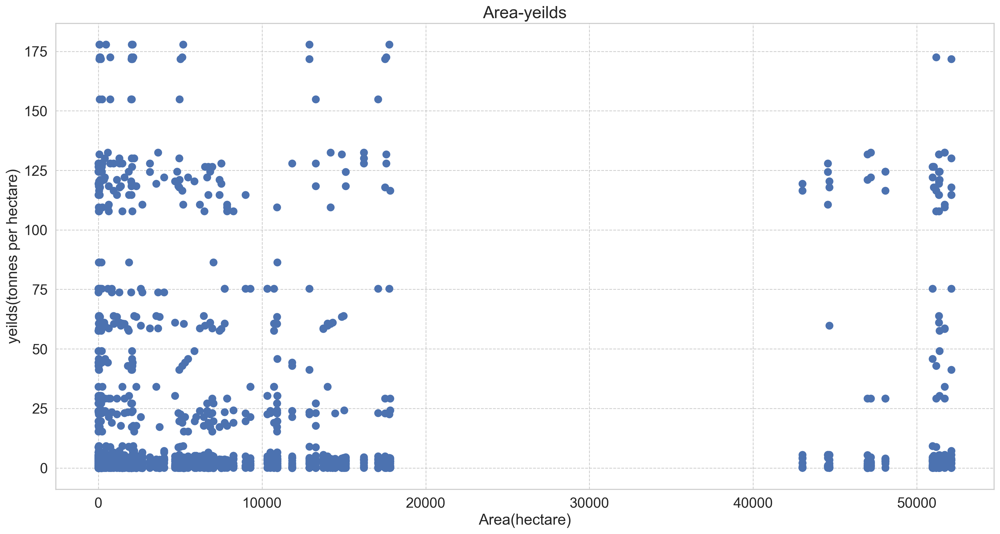

In [85]:
plt.figure(figsize=(20, 10), dpi=200)
plt.scatter(
    x=df["Area"], y=df["yeilds"], s=70
)
plt.title("Area-yeilds", fontsize=20)
plt.xlabel("Area(hectare)", fontsize=18)
plt.ylabel("yeilds(tonnes per hectare)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

<font face="zar bold" size=20>Re-analyzing this chart👆<font>
<br><br>
General Analysis:<br>
A concentration of points near the y-axis = 0:
<br>
A large number of yield points are close to zero.
<br>
This could mean:
<br>
The fields are not cultivated.
<br>
Very little harvest has been made.
<br>
Or the data is noisy or incorrect (e.g., a zero value has been entered incorrectly).
<br>
Apparently clustered on the x-axis (area):
<br>
The Area values are mostly concentrated in a few intervals (e.g., less than 50, and around 200).
<br>
This indicates that the fields are specifically measured or recorded in certain sizes (e.g., grouped).
<br>
Extreme dispersion of yields for small areas:
<br>
For fields of less than 50 hectares, yields are very variable and can reach up to 175 tons per hectare.
<br>
This could indicate very different farm performance or measurement problems on small plots.
<br>
There is no specific pattern between Area and Yields:
<br>
The graph does not show a clear correlation between area and yield.
<br>
That is, a larger plot does not necessarily mean a higher or lower yield.

<font face="zar bold" size=20 color="orange">Suspicious points:<font>
<br><br>
Yields above 100 tons per hectare are very high for common agricultural crops and are likely either crop-specific or data entry errors.
<br>
Some areas in the [200–220 ha] range have very low yields (below 5),<br>which may indicate abandoned land or exploitation problems.

In [86]:
Season_Irrigation = df.groupby(["Season", "Irrigation"]).size().unstack(fill_value=0)

Season_Irrigation

Irrigation,Basin,Drip,Spray
Season,,,
Kharif,99,177,155
Rabi,453,530,359
Zaid,146,203,211


<font size=16>Explanation of irrigation method and seasons:<font><br>
irrigation:<br>
Basin:<br>
Basin irrigation is a surface irrigation method where fields are divided into level basins,<br> typically surrounded by bunds (small earthen ridges), and then flooded with water to irrigate crops
<br><br>
Drip:<br>
Drip irrigation, also known as trickle irrigation,<br>is a method of applying water directly to the root zone of plants, minimizing water loss through evaporation and runoff
<br><br>
Spray:<br>
Spray irrigation, also known as sprinkler irrigation, is a method of applying water to crops or landscapes by spraying it through a network of pipes and sprinkler heads.

<font size=10 face="time new roman">Season:<br><br>
zaid:<br>
The Zaid season, also known as the summer season, is a short cropping season in India that<br> occurs between the Rabi and Kharif seasons,<br>typically from March to June.<br>
It's characterized by warm, dry weather and longer day lengths, ideal for the growth of certain crops. 
<br><br>
kharif:<br>
The Kharif season, also known as the monsoon season, is a crop-growing period in India,<br> Pakistan, and Bangladesh, primarily from June to October.<br>
It's characterized by the onset of monsoon rains, which are crucial for cultivating crops like rice, maize, and cotton. 
<br><br>
Rabi:<br>
The Rabi season in agriculture refers to the winter cropping season in regions with a monsoon or wet season.<br>
It's characterized by the sowing of crops in the winter (October to December) and harvesting in the spring (March to May). The term "Rabi" itself is derived from an Arabic word meaning "spring," which aligns with the harvest period. 


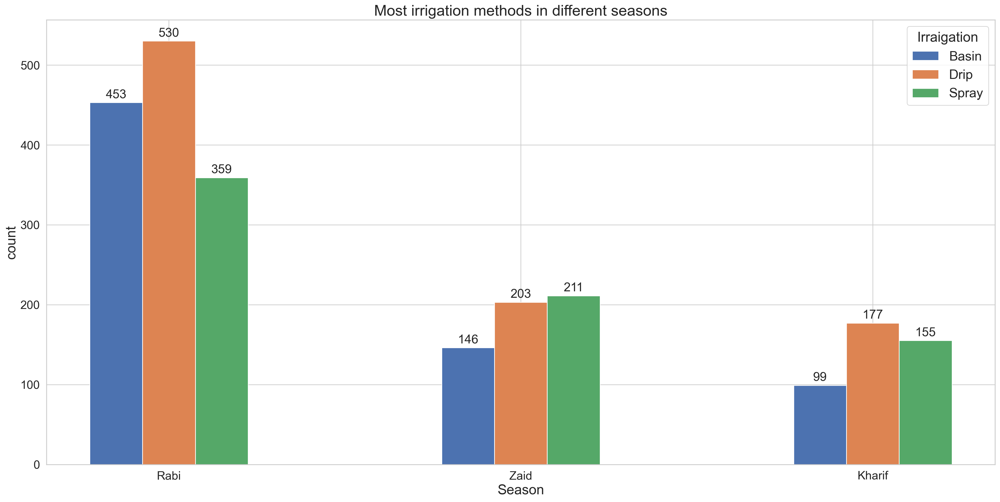

In [87]:
season = ("Rabi", "Zaid", "Kharif")
irraigation = {
    "Basin": (453, 146, 99),
    "Drip": (530, 203, 177),
    "Spray": (359, 211, 155),
}
x = np.arange(len(season))
width = 0.15
multiplier = 0
fig, ax = plt.subplots(figsize=(20, 10), dpi=200, layout="constrained")
for attribute, measurement in irraigation.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3, fontsize=18)
    multiplier += 1
ax.set_title("Most irrigation methods in different seasons", fontsize=22)
ax.set_xlabel("Season", fontsize=20)
ax.set_ylabel("count", fontsize=20)
ax.set_xticks(x + width, season)
ax.legend(title="Irraigation", loc="best", fontsize=19, title_fontsize=20)
ax.tick_params(axis="both", labelsize=17)
plt.show()

<font size=10 face="time new roman Italic">
In the Rabi, the most commonly used type of irrigation was drip and basin irrigation.<br>
In the Zaid, the most commonly used type of irrigation was Spary and drip irrigation.<br>
In the kharif, the most commonly used type of irrigation was drip and spary irrigation.

In [88]:
Season_Crops = df.groupby(["Season", "Crops"]).size().unstack(fill_value=0)

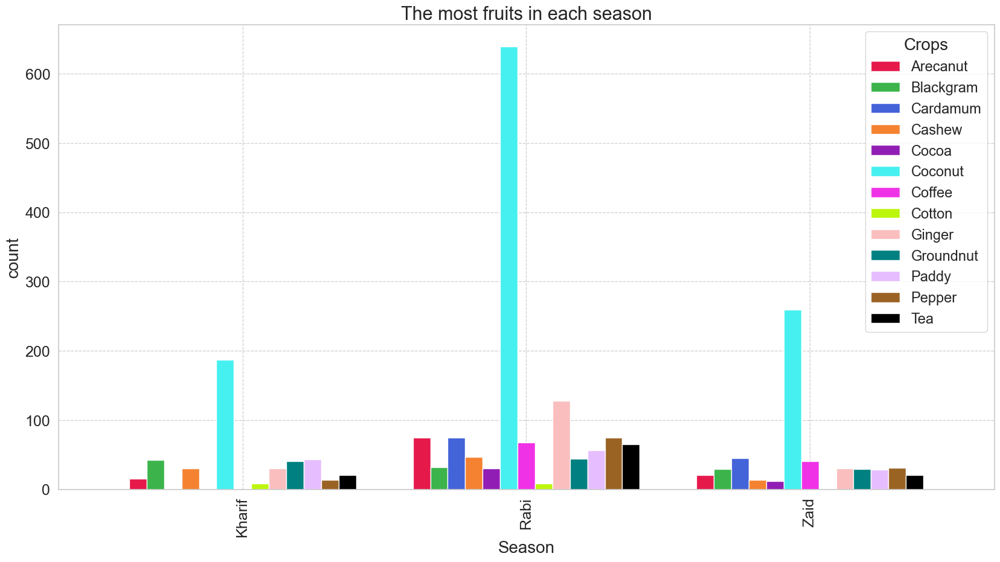

In [89]:
colors = [
    '#e6194b', 
    '#3cb44b',  
    '#4363d8',  
    '#f58231',  
    '#911eb4',  
    '#46f0f0',  
    '#f032e6',  
    '#bcf60c',  
    '#fabebe',  
    '#008080',  
    '#e6beff',  
    '#9a6324', 
    "black"]


Season_Crops.plot(
    kind="bar", figsize=(20, 10), grid=True, fontsize=18, width=0.8, color=colors
)
plt.title("The most fruits in each season", fontsize=22)
plt.xlabel("Season", fontsize=20)
plt.ylabel("count", fontsize=20)
plt.legend(title="Crops", fontsize=17, title_fontsize=20)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

<font face="time new roman" size=10>
Kharif, Rabi, and Zaid. Coconut is the most prominent crop in all seasons, with significantly higher counts compared to other crops. The Rabi season shows the highest diversity and quantity of crops, while Kharif and Zaid have relatively lower counts. This highlights the seasonal variation in crop cultivation practices.

# Now let's compare different features with the price feature and their impact.

In [90]:
mean_price_loc = df.groupby(["Location"])["price"].mean()
mean_price_loc.sort_values(inplace=True, ascending=False)
mean_price_loc

Location
Gulbarga         88382.802575
Kodagu           87739.759740
Mangalore        87659.333333
Mysuru           87477.485000
Hassan           87226.293463
Raichur          85649.270588
Kasaragodu       85072.852564
Chikmangaluru    84417.969605
Madikeri         84415.404412
Name: price, dtype: float64

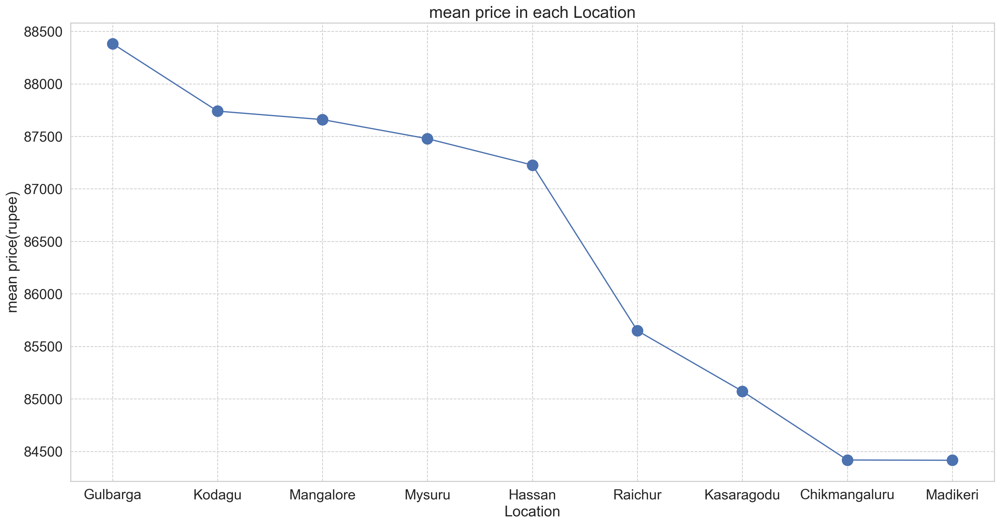

In [91]:
plt.figure(figsize=(20, 10), dpi=200)
mean_price_loc.plot(marker='o', markersize=13)
plt.title("mean price in each Location", fontsize=20)
plt.xlabel("Location", fontsize=18)
plt.ylabel("mean price(rupee)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.grid(True, linestyle="--", linewidth=0.9)
plt.show()

<font face="zar" size=10>
Cities:<br>
Gulbarga, Kodagu, Mangalore, Mysuru, Hassan
have prices above 87 thousand.
It may depend on other factors such as soil type, cultivation method, and type of irrigation and crop.

The effect of soil type on price

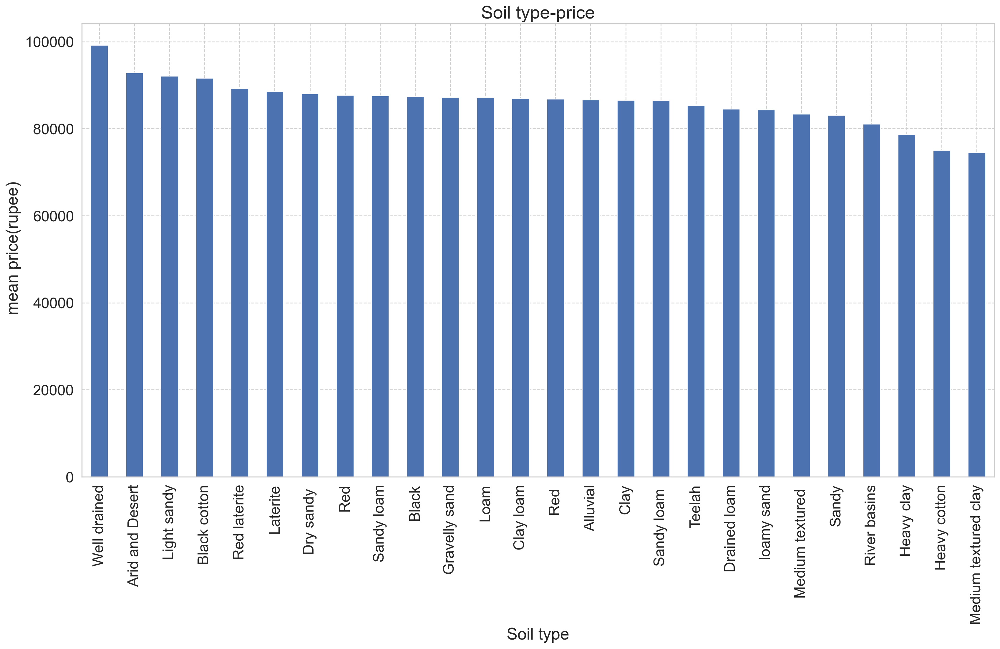

In [92]:
plt.figure(figsize=(20, 10), dpi=200)
df.groupby(["Soil type"])["price"].mean().sort_values(ascending=False).plot(kind="bar")
plt.title("Soil type-price", fontsize=22)
plt.xlabel("Soil type", fontsize=20)
plt.ylabel(" mean price(rupee)", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
plt.grid(True, linestyle='--', linewidth=1)
plt.show()

<font face="B Nazanin Bold" size=8>
This chart represents the average price based on soil type.<br>
Drained soils have the highest average price.<br>
Medium-textured soils show the lowest average price.
</font>


The impact of product type on price

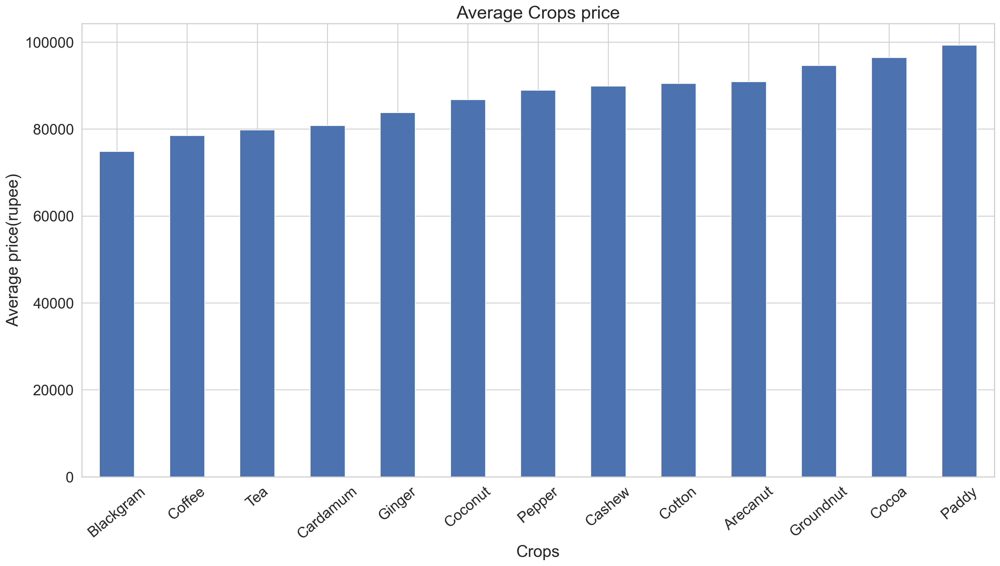

In [93]:
plt.figure(figsize=(20, 10), dpi=200)
df.groupby(["Crops"])["price"].mean().sort_values(ascending=True).plot(
    kind="bar"
)
plt.title("Average Crops price", fontsize=22)
plt.xlabel("Crops", fontsize=20)
plt.ylabel("Average price(rupee)",fontsize=20)
plt.xticks(rotation=40)
plt.tick_params(axis="both", labelsize=18)
plt.show()

<font size=8>
This chart illustrates the average crop prices in rupees for various crops. Paddy has the highest average price, followed closely by Cocoa and Groundnut. Blackgram and Coffee are among the crops with relatively lower average prices. The data highlights significant price variations across different crops, which may depend on factors like demand, cultivation costs, and regional preferences.

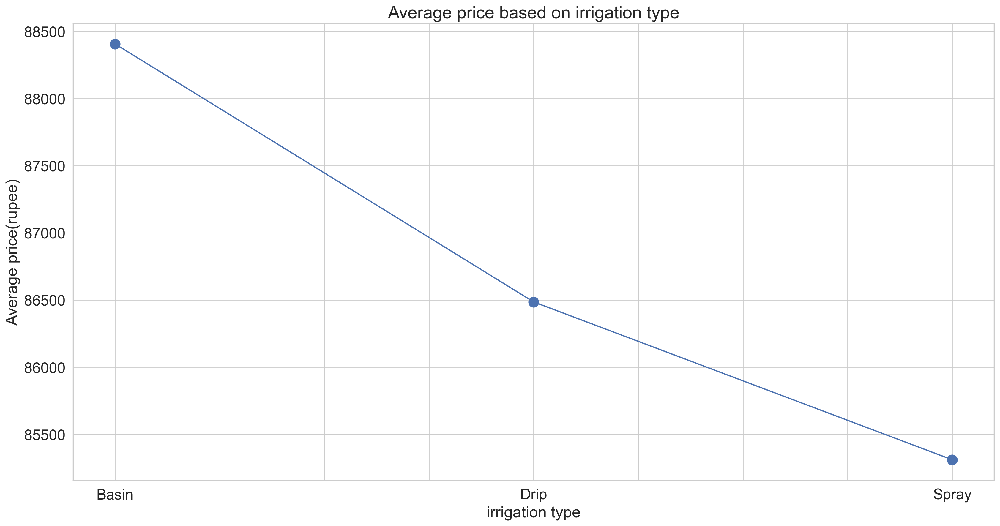

In [94]:
plt.figure(figsize=(20, 10), dpi=200)
df.groupby(["Irrigation"])["price"].mean().plot(marker='o', markersize=12)
plt.title("Average price based on irrigation type", fontsize=21)
plt.xlabel("irrigation type", fontsize=19)
plt.ylabel("Average price(rupee)", fontsize=19)
plt.tick_params(axis="both", labelsize=18)
plt.show()

<font size=8 face='zar'>
Basin irrigation:<br>has the highest average price, indicating that crops grown using this method may have higher market value or production costs.<br>
Drip irrigation:<br>comes second, suggesting efficient water usage and moderate crop prices.<br>
Spray irrigation:<br>has the lowest average price, which could be due to lower production costs or market demand for crops grown using this method.<br>

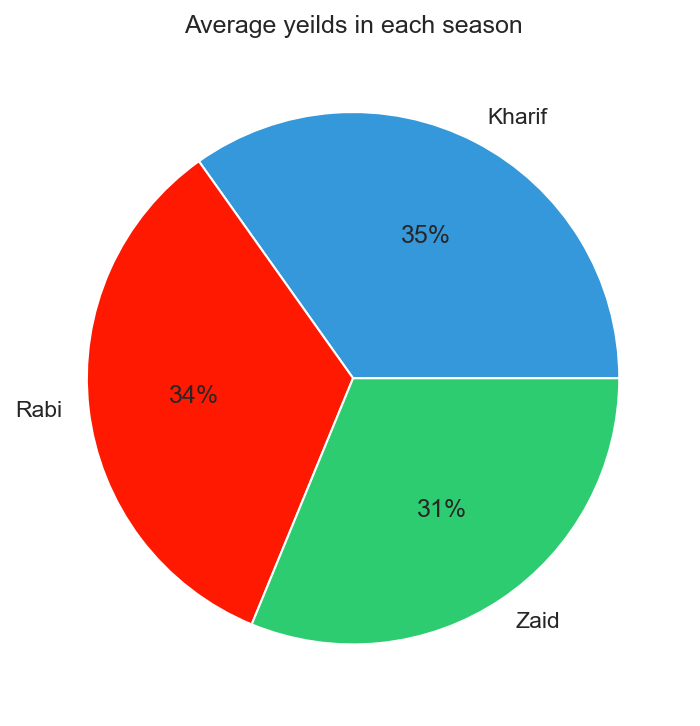

In [95]:
plt.figure(figsize=(7, 5), dpi=150)
df.groupby(["Season"])["yeilds"].mean().plot(
    kind="pie", autopct="%1.0f%%", colors=["#3498db", "#ff1900", "#2ecc71"]
)
plt.ylabel("")
plt.title("Average yeilds in each season")
plt.tight_layout()

<font size=8 face="zar">
This pie chart illustrates the average yields in each agricultural season.<br>The Kharif season accounts for the highest yield at 35%, followed by the Rabi season at 34%, and the Zaid season at 31%.<br>It highlights the seasonal variation in agricultural productivity.


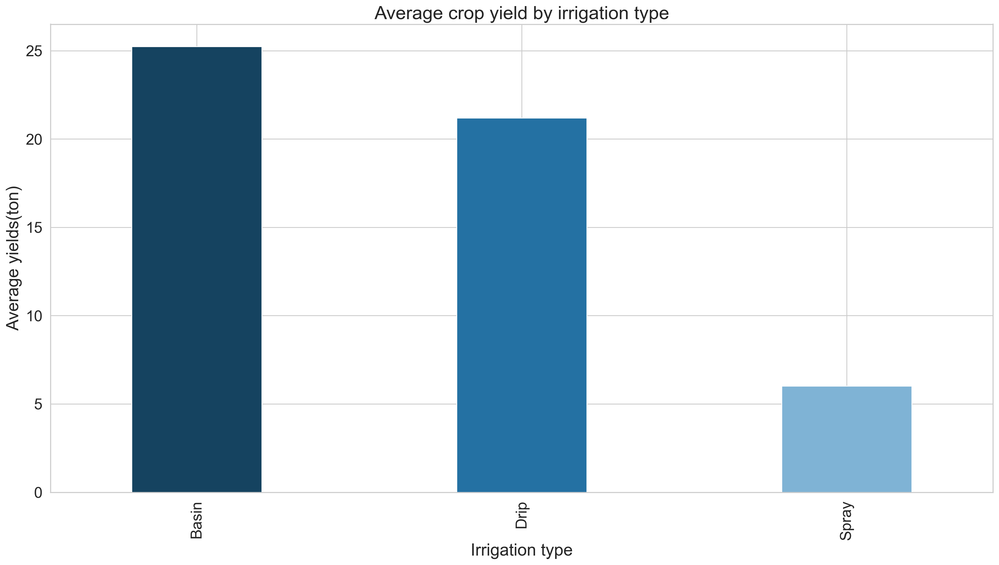

In [96]:
plt.figure(figsize=(20, 10), dpi=200)
df.groupby(["Irrigation"])["yeilds"].mean().plot(
    kind="bar",
    width=0.4,
    color=[
        "#154360",
        "#2471a3",
        "#7fb3d5"
    ]
)
plt.title("Average crop yield by irrigation type", fontsize=22)
plt.xlabel("Irrigation type", fontsize=20)
plt.ylabel("Average yields(ton)", fontsize=20)
plt.tick_params(axis="both", labelsize=18)

<font size=8 face="time new roman">
This bar chart illustrates the average crop yield by irrigation type.<br>Basin irrigation has the highest average yield, followed by Drip irrigation, while Spray irrigation shows the lowest yield.<br>The data highlights the efficiency of Basin and Drip irrigation methods in enhancing crop productivity.<br>Spray irrigation may be less effective or suitable for certain crops or regions.

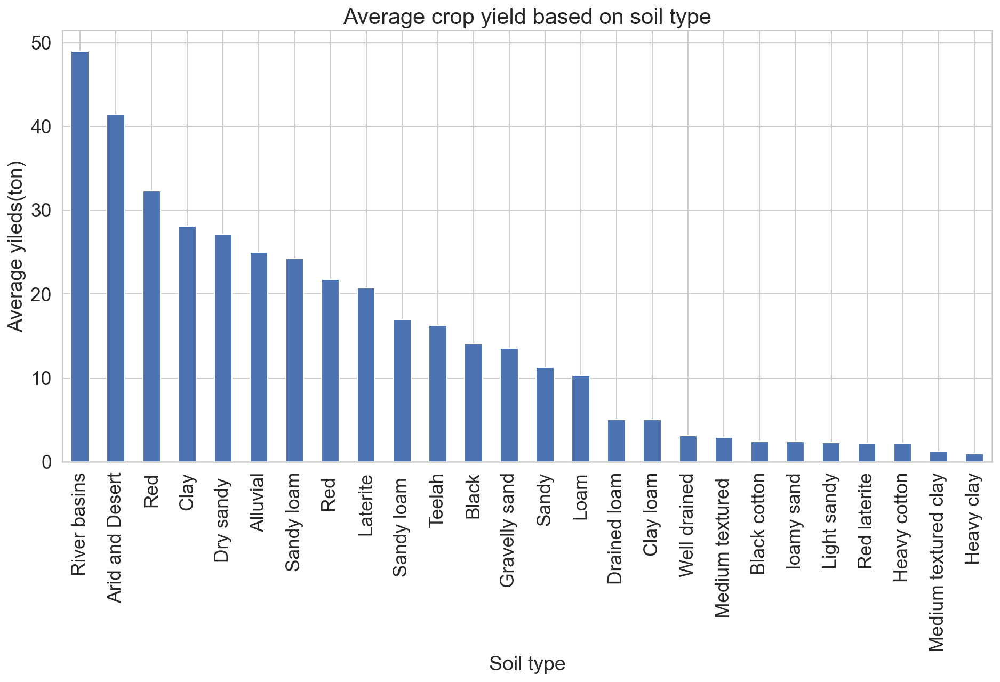

In [97]:
plt.figure(figsize=(15, 7), dpi=150)
df.groupby(["Soil type"])["yeilds"].mean().sort_values(ascending=False).plot(kind="bar")
plt.title("Average crop yield based on soil type", fontsize=20)
plt.xlabel("Soil type", fontsize=18)
plt.ylabel("Average yileds(ton)", fontsize=18)
plt.tick_params(axis="both", labelsize=17)
plt.show()

<font size=8 face="zar Bold">
This bar chart illustrates the average crop yield based on soil type. River basins show the highest average yield, followed by Arid and Desert soils. Heavy clay soils have the lowest average yield.

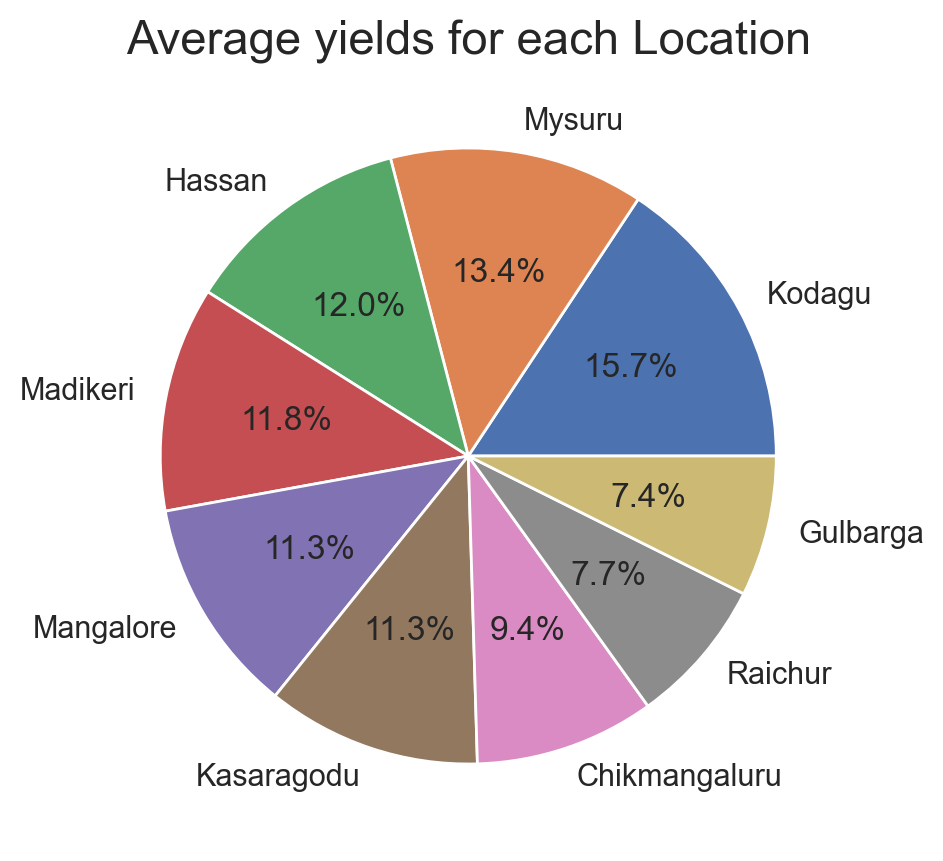

In [98]:
plt.figure(figsize=(10, 5), dpi=200)
df.groupby(["Location"])["yeilds"].mean().sort_values(ascending=False).plot(
    kind="pie", autopct="%1.1f%%"
)
plt.title("Average yields for each Location", fontsize=17)
plt.ylabel("")
plt.show()

<font size=8 face="zar Bold">
This graph shows that Kodagu city had the highest crop yield and the city had the lowest yield
<font>

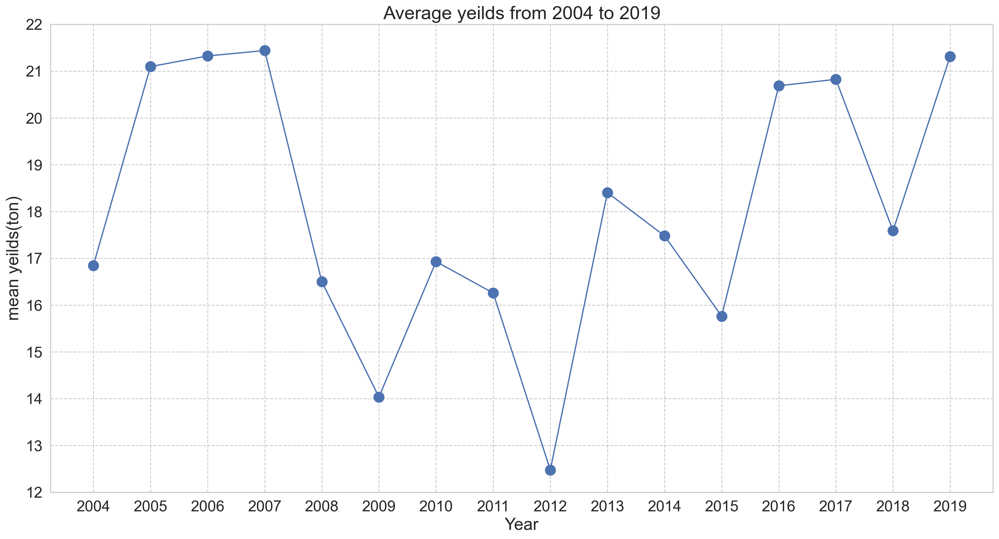

In [99]:
plt.figure(figsize=(20, 10), dpi=200)
df.groupby(["Year"])["yeilds"].mean().plot(marker="o", markersize=12)
plt.title("Average yeilds from 2004 to 2019", fontsize=22)
plt.xlabel("Year", fontsize=20)
plt.ylabel("mean yeilds(ton)", fontsize=20)
plt.tick_params(axis="both", labelsize=18)
plt.xticks(range(2004, 2020, 1))
plt.yticks(range(12, 23, 1))
plt.grid(True, linestyle="--")
plt.show()

<font size=8>
This chart illustrates the average yields from 2004 to 2019. The data shows significant fluctuations in yields over the years, with peaks observed in 2005, 2012, and 2019. The lowest yield occurred in 2012, indicating potential challenges in agricultural productivity during that year.